In [ ]:
pip install torch torchvision tensorboard scikit-learn

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: python3.12 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [21]:
import os
import time
import random
from collections import Counter

import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image, ImageDraw

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split, Subset, WeightedRandomSampler
from torch.utils.tensorboard import SummaryWriter
from torch.optim.lr_scheduler import ReduceLROnPlateau

import torchvision
from torchvision import models, transforms
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
from torchvision.models.detection import MaskRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.image_list import ImageList
from torchvision.ops import nms, box_iou, MultiScaleRoIAlign
from torchvision.ops.boxes import masks_to_boxes
import torchvision.transforms.functional as TF
from torchvision.transforms.functional import InterpolationMode, resize
import torchvision.transforms.v2 as T

from sklearn.metrics import classification_report, confusion_matrix

In [22]:
# Set random seed for reproducibility
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

# Check CUDA availability
print(f"CUDA available: {torch.cuda.is_available()}")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Enable optimizations if using CUDA
if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    torch.cuda.empty_cache()

CUDA available: True
Using device: cuda


In [23]:
# Function to patch weighted loss to the classifier with focal loss option
def patch_loss_classifier(model, class_weights, use_focal_loss=True, gamma=2.0):
    if use_focal_loss:
        def focal_loss_fn(class_logits, labels):
            log_probs = F.log_softmax(class_logits, dim=-1)
            probs = torch.exp(log_probs)
            
            # One-hot encoding of labels
            label_one_hot = torch.zeros_like(class_logits)
            label_one_hot.scatter_(1, labels.unsqueeze(1), 1)
            
            # Apply class weights
            weights = class_weights.unsqueeze(0).expand_as(class_logits)
            weights = weights * label_one_hot
            weights = weights.sum(dim=1)
            
            # Focal loss calculation: (1-p)^gamma * CE
            focal_weights = (1 - probs.gather(1, labels.unsqueeze(1))).pow(gamma)
            loss = F.nll_loss(log_probs, labels, reduction='none') * focal_weights.squeeze()
            
            return (loss * weights).mean()
        
        model.roi_heads.loss_classifier = focal_loss_fn
    else:
        # Original weighted cross-entropy
        def weighted_loss_fn(class_logits, labels):
            return F.cross_entropy(class_logits, labels, weight=class_weights)
        
        model.roi_heads.loss_classifier = weighted_loss_fn

In [24]:
def get_transform(train):
    if train:
        return T.Compose([
            T.ToImage(),
            T.RandomPhotometricDistort(contrast=(0.8, 1.2), brightness=(0.8, 1.2), p=0.5),
            T.RandomHorizontalFlip(0.3),
            T.RandomApply([T.RandomAffine(degrees=5, translate=(0.02, 0.02), scale=(0.98, 1.02))], p=0.3),
            T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.05, hue=0.01),
            T.ToDtype(torch.float, scale=True)
        ])
    else:
        return T.Compose([
            T.ToImage(),
            T.ToDtype(torch.float, scale=True)
        ])

In [25]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, transforms=None, iou_threshold=0.5, min_area=100):
        self.root_dir = root_dir
        self.transforms = transforms
        self.iou_threshold = iou_threshold
        self.min_area = min_area

        self.imgs = []
        self.masks = []
        self.manu_to_label = {}
        label_counter = 1

        for manu_name in os.listdir(root_dir):
            manu_path = os.path.join(root_dir, manu_name)
            if not os.path.isdir(manu_path) or manu_name.startswith('.'):
                continue

            if manu_name.lower() in ["no manufacturer data", "no accession number match", "rti"]:
                continue

            if manu_name not in self.manu_to_label:
                self.manu_to_label[manu_name] = label_counter
                label_counter += 1

            for ind_name in os.listdir(manu_path):
                ind_path = os.path.join(manu_path, ind_name)
                if not os.path.isdir(ind_path) or ind_name.startswith('.'):
                    continue

                images_path = os.path.join(ind_path, "images")
                masks_path = os.path.join(ind_path, "masks")

                if os.path.exists(images_path) and os.path.exists(masks_path):
                    for img_name in os.listdir(images_path):
                        if not img_name.startswith('.'):
                            img_path = os.path.join(images_path, img_name)
                            mask_base = os.path.splitext(img_name)[0]
                            mask_name = f"{mask_base}_mask.jpg"
                            mask_path = os.path.join(masks_path, mask_name)
                            if os.path.exists(mask_path):
                                self.imgs.append((img_path, manu_name))
                                self.masks.append(mask_path)

        print(f"Found {len(self.imgs)} images and {len(self.masks)} masks")
        print("Manufacturer to label mapping:", self.manu_to_label)

    def __len__(self):
        return len(self.imgs)

    def _process_mask(self, mask):

        unique_mask = mask[0, :, :] + mask[1, :, :] * 256 + mask[2, :, :] * 256 * 256
        binary_mask = (unique_mask > 0)
        binary_np = binary_mask.numpy()
        filled_binary = ndimage.binary_fill_holes(binary_np)
        cross = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], dtype=np.bool_)
        closed = ndimage.binary_closing(filled_binary, structure=cross, iterations=1)
        final_filled = ndimage.binary_fill_holes(closed)
        labeled_array, num_features = ndimage.label(final_filled)
        labeled_mask = torch.from_numpy(labeled_array)

        masks = []
        for i in range(1, num_features + 1):
            component_mask = (labeled_mask == i)
            if torch.sum(component_mask) > self.min_area:
                masks.append(component_mask)

        return torch.stack(masks) if masks else torch.zeros((0, mask.shape[1], mask.shape[2]), dtype=torch.bool)

    def _get_tight_boxes(self, masks, base_padding=5):
        boxes = []
        filtered_masks = []

        for mask in masks:
            y_indices, x_indices = torch.where(mask)
            if len(y_indices) > 0 and len(x_indices) > 0:
                x_min_raw = torch.min(x_indices).item()
                y_min_raw = torch.min(y_indices).item()
                x_max_raw = torch.max(x_indices).item()
                y_max_raw = torch.max(y_indices).item()

                raw_width = x_max_raw - x_min_raw
                raw_height = y_max_raw - y_min_raw
                mask_area = torch.sum(mask).item()
                area_factor = min(1.5, max(1.0, (mask_area / 10000) * 1.2))

                if raw_width > raw_height * 2:
                    padding = base_padding * 1.4 * area_factor
                elif raw_height > raw_width * 2:
                    padding = base_padding * 1.4 * area_factor
                else:
                    padding = base_padding * area_factor

                x_min = max(0, x_min_raw - padding)
                y_min = max(0, y_min_raw - padding)
                x_max = min(mask.shape[1], x_max_raw + padding)
                y_max = min(mask.shape[0], y_max_raw + padding)

                width = x_max - x_min
                height = y_max - y_min
                area = width * height
                aspect_ratio = width / height if height > 0 else 0

                if area > self.min_area * 0.8 and 0.1 < aspect_ratio < 10:
                    boxes.append([x_min, y_min, x_max, y_max])
                    filtered_masks.append(mask)

        return (torch.tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0, 4), dtype=torch.float32)), filtered_masks

    def _apply_nms(self, boxes, scores=None, iou_threshold=None):
        if len(boxes) == 0:
            return torch.tensor([], dtype=torch.int64)
        if scores is None:
            scores = torch.ones(len(boxes))
        threshold = self.iou_threshold if iou_threshold is None else iou_threshold

        return nms(boxes, scores, threshold)

    def _resize_with_lockstep_precision(self, img, mask, target_size=2048):

        c_img, h, w = img.shape
        c_mask = mask.shape[0]
        scale = min(target_size / h, target_size / w)
        new_h, new_w = int(h * scale), int(w * scale)

        resized_img = resize(img, size=(new_h, new_w), interpolation=InterpolationMode.BILINEAR, antialias=True)
        resized_mask = resize(mask, size=(new_h, new_w), interpolation=InterpolationMode.NEAREST)

        padded_img = torch.zeros((c_img, target_size, target_size), dtype=img.dtype)
        padded_mask = torch.zeros((c_mask, target_size, target_size), dtype=mask.dtype)

        h_offset = (target_size - new_h) // 2
        w_offset = (target_size - new_w) // 2

        padded_img[:, h_offset:h_offset+new_h, w_offset:w_offset+new_w] = resized_img
        padded_mask[:, h_offset:h_offset+new_h, w_offset:w_offset+new_w] = resized_mask

        return padded_img, padded_mask, (h_offset, w_offset, new_h, new_w)

    def __getitem__(self, idx):
        img_path, manu = self.imgs[idx]
        mask_path = self.masks[idx]

        img = read_image(img_path)
        if img.shape[0] == 1:
            img = img.repeat(3, 1, 1)
        img = img.float() / 255.0 if img.max() > 1.0 else img.float()

        mask = read_image(mask_path).byte()
        img, mask, _ = self._resize_with_lockstep_precision(img, mask, 2048)

        masks = self._process_mask(mask)
        boxes, filtered_masks = self._get_tight_boxes(masks, base_padding=2)

        if len(boxes) > 0:
            keep = self._apply_nms(boxes)
            boxes = boxes[keep]
            filtered_masks = [filtered_masks[i] for i in keep] if filtered_masks else []
            masks = torch.stack(filtered_masks) if filtered_masks else torch.zeros((0, mask.shape[1], mask.shape[2]), dtype=torch.bool)
        else:
            masks = torch.zeros((0, mask.shape[1], mask.shape[2]), dtype=torch.bool)

        labels = torch.full((boxes.shape[0],), self.manu_to_label[manu], dtype=torch.int64)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": masks,
            "area": area,
            "image_id": torch.tensor([idx]),
            "iscrowd": torch.zeros((boxes.shape[0],), dtype=torch.int64)
        }

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        h, w = img.shape[1:]
        boxes = target["boxes"]
        boxes[:, 0].clamp_(0, w - 1)
        boxes[:, 1].clamp_(0, h - 1)
        boxes[:, 2].clamp_(0, w - 1)
        boxes[:, 3].clamp_(0, h - 1)
        target["boxes"] = boxes

        return img, target


In [26]:
def visualize_augmented_samples(dataset, num_samples=5):
    shown = 0
    attempts = 0
    while shown < num_samples and attempts < 20:
        idx = random.randint(0, len(dataset) - 1)
        try:
            img, target = dataset[idx]
            boxes = target["boxes"]
            masks = target["masks"]

            img_disp = TF.to_pil_image(img.byte()).convert("RGB")
            draw = ImageDraw.Draw(img_disp)

            # Draw boxes
            for box in boxes:
                box = box.tolist()
                draw.rectangle(box, outline="red", width=3)

            # Prepare mask display
            if len(masks) > 0:
                combined_mask = torch.amax(masks, dim=0).byte() * 255
                mask_disp = TF.to_pil_image(combined_mask)
            else:
                mask_disp = Image.new("L", img_disp.size)

            fig, axs = plt.subplots(1, 2, figsize=(12, 6))
            axs[0].imshow(img_disp)
            axs[0].set_title(f"Image with Boxes | idx={idx}")
            axs[0].axis("off")

            axs[1].imshow(mask_disp, cmap="gray")
            axs[1].set_title("Combined Binary Mask")
            axs[1].axis("off")

            plt.tight_layout()
            plt.show()
            shown += 1

        except (ValueError, IndexError) as e:
            print(f"Skipping idx {idx} due to: {e}")
            continue


In [28]:
def compute_class_weights(dataset, num_classes):

    # Count instances for each class
    class_counts = torch.zeros(num_classes)
    for i in range(len(dataset)):
        _, target = dataset[i]
        labels = target["labels"]
        for label in labels:
            class_counts[label] += 1

    class_counts = torch.clamp(class_counts, min=1)

    weights = 1.0 / class_counts
    weights = weights / weights.sum() * num_classes

    # Force stronger weights for rare or underperforming classes
    boosted_weights = weights.clone()
    
    # Manually increase weight for class 2 (label=2)
    boosted_weights[2] = max(boosted_weights[2], 6.0)  

    for idx in [1, 3, 4]:
        boosted_weights[idx] = max(boosted_weights[idx], 3.0)
    
    # Normalize to keep consistent sum
    boosted_weights = boosted_weights / boosted_weights.sum() * num_classes

    print("Class counts:", class_counts.tolist())
    print("Adjusted class weights:", boosted_weights.tolist())

    return boosted_weights


def get_sampler(subset_dataset, num_classes):
    full_dataset = subset_dataset.dataset
    subset_indices = subset_dataset.indices

    label_counts = Counter()
    sample_weights = []
    skipped = 0

    for i in subset_indices:
        _, target = full_dataset[i]
        labels = target['labels'].tolist()

        if len(labels) == 0:
            print(f"Skipping: {full_dataset.imgs[i][0]}")
            skipped += 1
            continue

        for l in labels:
            label_counts[l] += 1

    total_labels = sum(label_counts.values())
    class_weights = {label: total_labels / (count + 1e-6) for label, count in label_counts.items()}

    for i in subset_indices:
        _, target = full_dataset[i]
        labels = target['labels'].tolist()

        if len(labels) == 0:
            continue

        weight = sum(class_weights[l] for l in labels) / len(labels)
        sample_weights.append(weight)

    print(f"Skipped {skipped} images with no valid masks or labels.")
    return WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)


In [29]:
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.001):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, current_score):
        if self.best_score is None or current_score > self.best_score + self.min_delta:
            self.best_score = current_score
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        return self.early_stop

In [32]:
def verify_ground_truth(dataset, num_samples=5, random_seed=None):
    """
    Visualize ground truth masks and boxes for random samples to verify data quality.
    
    Args:
        dataset: Dataset to sample from
        num_samples: Number of samples to visualize
        random_seed: Optional seed for reproducible sampling
    """  
    # Set random seed if provided
    if random_seed is not None:
        torch.manual_seed(random_seed)
        np.random.seed(random_seed)
    
    indices = torch.randperm(len(dataset))[:num_samples].tolist()
    
    # Create label to manufacturer mapping
    label_to_manu = {v: k for k, v in dataset.manu_to_label.items()} if hasattr(dataset, 'manu_to_label') else None
    
    base_dataset = dataset.dataset if isinstance(dataset, torch.utils.data.Subset) else dataset
    
    for i, idx in enumerate(indices):
        actual_idx = dataset.indices[idx] if isinstance(dataset, torch.utils.data.Subset) else idx
        
        image, target = dataset[idx]
        
        if hasattr(base_dataset, 'imgs'):
            img_path, manu = base_dataset.imgs[actual_idx]
            print(f"\nSample {i+1}/{num_samples} (Index {actual_idx}):")
            print(f"Image path: {img_path}")
            print(f"Manufacturer: {manu}")
        else:
            print(f"\nSample {i+1}/{num_samples} (Index {actual_idx})")
        
        boxes = target['boxes']
        masks = target['masks'] if 'masks' in target else None
        labels = target['labels']
        
        print(f"Number of objects: {len(boxes)}")
        print(f"Labels: {labels.tolist()}")
        
        if label_to_manu:
            label_names = [label_to_manu.get(l.item(), f"Unknown ({l.item()})") for l in labels]
            print(f"Manufacturers: {label_names}")
        
        print("Bounding boxes:")
        for j, box in enumerate(boxes):
            print(f"  Box {j+1}: {box.tolist()}")
        
        if image.shape[0] == 1:
            image = image.repeat(3, 1, 1)
        
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(image.permute(1, 2, 0))
        axes[0].set_title("Original Image")
        axes[0].axis("off")
        
        img_with_masks = image.clone()
        if masks is not None and len(masks) > 0:
            img_with_masks = draw_segmentation_masks(img_with_masks, masks > 0.5, alpha=0.5, colors="red")
        axes[1].imshow(img_with_masks.permute(1, 2, 0))
        axes[1].set_title("Segmentation Masks")
        axes[1].axis("off")
        
        img_with_boxes = image.clone()
        if masks is not None and len(masks) > 0:
            img_with_boxes = draw_segmentation_masks(img_with_boxes, masks > 0.5, alpha=0.3, colors="red")
        
        if label_to_manu:
            box_labels = [f"{label_to_manu.get(l.item(), f'Class {l.item()}')} ({l.item()})" for l in labels]
        else:
            box_labels = [f"Class {l.item()}" for l in labels]
        
        img_with_boxes = draw_bounding_boxes(img_with_boxes, boxes, labels=box_labels, colors="green", width=2)
        axes[2].imshow(img_with_boxes.permute(1, 2, 0))
        axes[2].set_title("Bounding Boxes & Labels")
        axes[2].axis("off")
        
        plt.tight_layout()
        plt.show()
        
        # Calculate mask-derived boxes for comparison
        if masks is not None and len(masks) > 0:
            mask_boxes = masks_to_boxes(masks)
            
            # Calculate IoU between mask-derived boxes and GT boxes
            if len(boxes) > 0 and len(mask_boxes) > 0:
                ious = box_iou(boxes, mask_boxes)
                
                print("\nIoU between GT boxes and mask-derived boxes:")
                for j in range(min(len(boxes), len(mask_boxes))):
                    print(f"  Object {j+1}: {ious[j, j].item():.4f}")
                
                # Overall alignment quality
                avg_iou = torch.diag(ious).mean().item()
                print(f"Average IoU: {avg_iou:.4f}")
                
                if avg_iou < 0.7:
                    print("Warning: Low average IoU indicates poor alignment between masks and boxes.")
                else:
                    print("Good alignment between masks and boxes.")
        
        print("-" * 50)
        
        # Ask for confirmation to continue
        if i < num_samples - 1:
            response = input("Press Enter to continue to the next sample, or type 'q' to quit: ")
            if response.lower() == 'q':
                break

In [33]:
def compute_mask_iou_matrix(gt_masks, pred_masks):
    N, M = len(gt_masks), len(pred_masks)
    iou_matrix = torch.zeros((N, M))

    for i in range(N):
        for j in range(M):
            intersection = (gt_masks[i] & pred_masks[j]).float().sum()
            union = (gt_masks[i] | pred_masks[j]).float().sum()
            iou_matrix[i, j] = intersection / union if union > 0 else 0.0
    return iou_matrix

def visualize_results(model, dataloader, device, dataset, num_samples=5):
    """Visualize model predictions versus ground truth, and compute IoU between predicted and GT masks"""
    model.eval()
    
    with torch.no_grad():
        for i, (images, targets) in enumerate(dataloader):
            if i >= num_samples:
                break

            image = images[0].to(device)
            target = targets[0]

            # Ensure 3-channel input
            if image.shape[0] == 1:
                image = image.repeat(3, 1, 1)

            # Run prediction
            prediction = model([image])[0]

            # Filter predictions by score threshold
            keep = prediction['scores'] > 0.3
            pred_boxes = prediction['boxes'][keep].cpu()
            pred_labels = prediction['labels'][keep].cpu()
            pred_scores = prediction['scores'][keep].cpu()
            pred_masks = prediction['masks'][keep].cpu().squeeze(1) if 'masks' in prediction else None

            # Get GT annotations
            gt_boxes = target['boxes']
            gt_labels = target['labels']
            gt_masks = target['masks'].cpu() if 'masks' in target else None

            # Label mapping
            label_to_manu = {v: k for k, v in dataset.manu_to_label.items()}

            # IoU Evaluation
            if gt_masks is not None and pred_masks is not None and len(gt_masks) > 0 and len(pred_masks) > 0:
                bin_gt_masks = gt_masks > 0.5
                bin_pred_masks = pred_masks > 0.5
                iou_matrix = compute_mask_iou_matrix(bin_gt_masks, bin_pred_masks)
                matched_pred_indices = iou_matrix.argmax(dim=1)
                matched_ious = iou_matrix[torch.arange(len(gt_masks)), matched_pred_indices]

                print(f"\nSample {i+1}/{num_samples}")
                for idx, iou in enumerate(matched_ious):
                    print(f"  Object {idx+1}: IoU with best predicted mask = {iou:.4f}")
                print(f"Average IoU: {matched_ious.mean():.4f}")
            else:
                print(f"\nSample {i+1}/{num_samples}")
                print("  Skipping IoU calculation (missing masks).")

            # Visualization
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

            # Ground truth view
            img_gt = image.cpu().clone()
            if gt_masks is not None and len(gt_masks) > 0:
                img_gt = draw_segmentation_masks(img_gt, gt_masks > 0.5, alpha=0.5, colors="red")
            gt_label_texts = [f"{label_to_manu.get(l.item(), f'Class {l.item()}')} ({l.item()})" for l in gt_labels]
            img_gt = draw_bounding_boxes(img_gt, gt_boxes, labels=gt_label_texts, colors="green", width=2)

            ax1.imshow(img_gt.permute(1, 2, 0))
            ax1.set_title("Ground Truth")
            ax1.axis('off')

            # Prediction view
            img_pred = image.cpu().clone()
            if pred_masks is not None and len(pred_masks) > 0:
                img_pred = draw_segmentation_masks(img_pred, pred_masks > 0.5, alpha=0.5, colors="blue")
            pred_label_texts = [f"{label_to_manu.get(l.item(), f'Class {l.item()}')} ({l.item()}, {s:.2f})"
                                for l, s in zip(pred_labels, pred_scores)]
            img_pred = draw_bounding_boxes(img_pred, pred_boxes, labels=pred_label_texts, colors="yellow", width=2)

            ax2.imshow(img_pred.permute(1, 2, 0))
            ax2.set_title("Model Predictions")
            ax2.axis('off')

            plt.tight_layout()
            plt.show()


In [34]:
def visualize_ground_truth(dataset, num_samples=15, random_seed=None):
    """
    Visualize ground truth bounding boxes and masks from the dataset.
    
    Args:
        dataset: Dataset containing images, masks and bounding boxes
        num_samples: Number of samples to visualize
        random_seed: Optional seed for reproducible sampling
    """
    
    # Set random seed if provided
    if random_seed is not None:
        torch.manual_seed(random_seed)
        np.random.seed(random_seed)
    
    # Get random sample indices
    indices = torch.randperm(len(dataset))[:num_samples].tolist()
    
    # Create label to manufacturer mapping
    label_to_manu = {v: k for k, v in dataset.manu_to_label.items()}
    
    # Process each sample
    for i, idx in enumerate(indices):
        print(f"\nSample {i+1}/{num_samples} (Index {idx})")
        
        # Get the sample
        image, target = dataset[idx]
        
        # Get image path and manufacturer info
        if hasattr(dataset, 'imgs'):
            img_path, manu = dataset.imgs[idx]
            print(f"Image path: {img_path}")
            print(f"Manufacturer: {manu}")
        
        # Get boxes, masks, and labels
        boxes = target['boxes']
        masks = target['masks']
        labels = target['labels']
        
        print(f"Number of objects: {len(boxes)}")
        print(f"Labels: {labels.tolist()}")
        
        # Ensure image has 3 channels for visualization
        if image.shape[0] == 1:
            image = image.repeat(3, 1, 1)
        
        # Create visualization
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
        
        # Original image
        ax1.imshow(image.permute(1, 2, 0))
        ax1.set_title("Original Image")
        ax1.axis("off")
        
        # Image with masks
        img_with_masks = image.clone()
        if len(masks) > 0:
            img_with_masks = draw_segmentation_masks(
                img_with_masks, 
                masks > 0.5, 
                alpha=0.5,
                colors="red"
            )
        ax2.imshow(img_with_masks.permute(1, 2, 0))
        ax2.set_title("Segmentation Masks")
        ax2.axis("off")
        
        # Image with masks and boxes
        img_with_all = img_with_masks.clone()
        
        # Create labels for boxes
        box_labels = [
            f"{label_to_manu.get(l.item(), f'Class {l.item()}')} ({l.item()})" 
            for l in labels
        ]
        
        # Draw boxes
        if len(boxes) > 0:
            img_with_all = draw_bounding_boxes(
                img_with_all, 
                boxes, 
                labels=box_labels,
                colors="green", 
                width=2
            )
        
        ax3.imshow(img_with_all.permute(1, 2, 0))
        ax3.set_title("Masks & Bounding Boxes")
        ax3.axis("off")
        
        plt.tight_layout()
        plt.show()
        
        # Calculate mask-derived boxes for comparison
        if len(masks) > 0:
            mask_boxes = masks_to_boxes(masks)
            
            # Calculate IoU between mask-derived boxes and GT boxes
            if len(boxes) > 0 and len(mask_boxes) > 0:
                ious = box_iou(boxes, mask_boxes)
                
                print("\nIoU between GT boxes and mask-derived boxes:")
                for j in range(min(len(boxes), len(mask_boxes))):
                    print(f"  Object {j+1}: {ious[j, j].item():.4f}")
                
                # Overall alignment quality
                avg_iou = torch.diag(ious).mean().item()
                print(f"Average IoU: {avg_iou:.4f}")

In [35]:
def plot_losses(train_losses, val_losses, save_path=None):
    """
    Plot training and validation losses.
    
    Args:
        train_losses (list): List of training losses per epoch
        val_losses (list): List of validation losses per epoch
        save_path (str, optional): Path to save the plot image
    """
    plt.figure(figsize=(10, 6))
    epochs = range(1, len(train_losses) + 1)
    
    # Plot losses
    plt.plot(epochs, train_losses, 'b-', label='Training Loss')
    plt.plot(epochs, val_losses, 'r-', label='Validation Loss')
    
    # Add min points
    min_train_epoch = np.argmin(train_losses) + 1
    min_val_epoch = np.argmin(val_losses) + 1
    
    plt.plot(min_train_epoch, min(train_losses), 'bo', markersize=8)
    plt.plot(min_val_epoch, min(val_losses), 'ro', markersize=8)
    
    plt.annotate(f'Min: {min(train_losses):.4f}', 
                xy=(min_train_epoch, min(train_losses)),
                xytext=(min_train_epoch + 1, min(train_losses) + 0.05),
                arrowprops=dict(facecolor='blue', shrink=0.05))
    
    plt.annotate(f'Min: {min(val_losses):.4f}', 
                xy=(min_val_epoch, min(val_losses)),
                xytext=(min_val_epoch + 1, min(val_losses) + 0.05),
                arrowprops=dict(facecolor='red', shrink=0.05))
    
    # Calculate and display gap between training and validation loss
    final_gap = val_losses[-1] - train_losses[-1]
    plt.annotate(f'Final gap: {final_gap:.4f}', 
                xy=(len(train_losses), (val_losses[-1] + train_losses[-1])/2),
                xytext=(len(train_losses) - 5, (val_losses[-1] + train_losses[-1])/2 + 0.1),
                arrowprops=dict(facecolor='green', shrink=0.05))
    
    # styling
    plt.title('Training and Validation Loss', fontsize=16)
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)
    
    if len(train_losses) < 250:
        plt.axvline(x=len(train_losses), color='g', linestyle='--', alpha=0.7)
        plt.text(len(train_losses) + 0.5, max(max(train_losses), max(val_losses)) * 0.9, 
                 'Early Stopping', rotation=90, color='green')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

Found 467 images and 467 masks
Manufacturer to label mapping: {'seaspine mariner': 1, 'Depuy expedium (Synthes)': 2, 'Styker everest (K2M)': 3, 'orthofix firebird': 4, 'medtronic solera': 5, 'nuvasive reline': 6}

=== Verifying Ground Truth Data ===


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Sample 1/5 (Index 2):
Image path: xray_data/valid_data/seaspine mariner/117246037/images/117246037_00.jpg
Manufacturer: seaspine mariner
Number of objects: 6
Labels: [1, 1, 1, 1, 1, 1]
Manufacturers: ['seaspine mariner', 'seaspine mariner', 'seaspine mariner', 'seaspine mariner', 'seaspine mariner', 'seaspine mariner']
Bounding boxes:
  Box 1: [519.0, 950.0, 934.0, 1313.0]
  Box 2: [671.0, 1122.0, 1066.0, 1473.0]
  Box 3: [800.0, 1339.0, 1218.0, 1648.0]
  Box 4: [920.0, 1533.0, 1334.0, 1841.0]
  Box 5: [995.7999877929688, 1770.800048828125, 1468.199951171875, 1941.199951171875]
  Box 6: [1004.7999877929688, 1835.800048828125, 1587.199951171875, 2047.0]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


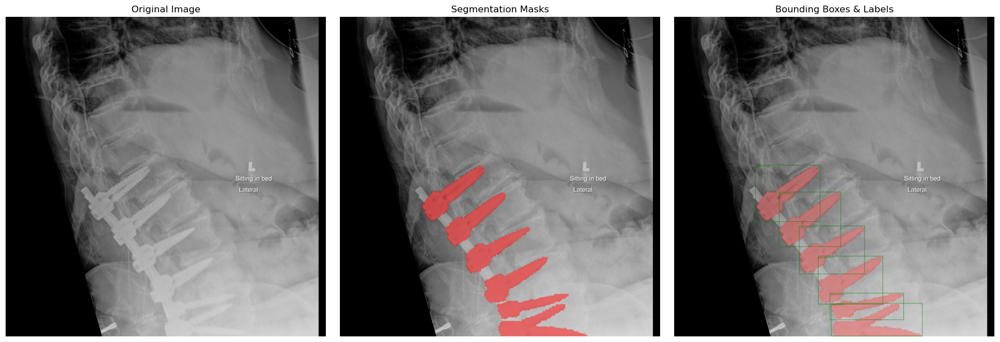


IoU between GT boxes and mask-derived boxes:
  Object 1: 0.9693
  Object 2: 0.9680
  Object 3: 0.9665
  Object 4: 0.9663
  Object 5: 0.9338
  Object 6: 0.9613
Average IoU: 0.9609
✅ Good alignment between masks and boxes.
--------------------------------------------------


Press Enter to continue to the next sample, or type 'q' to quit:  q

Do you want to proceed with model training? (y/n):  y


Preparing data and model...
Found 467 images and 467 masks
Manufacturer to label mapping: {'seaspine mariner': 1, 'Depuy expedium (Synthes)': 2, 'Styker everest (K2M)': 3, 'orthofix firebird': 4, 'medtronic solera': 5, 'nuvasive reline': 6}
Found 467 images and 467 masks
Manufacturer to label mapping: {'seaspine mariner': 1, 'Depuy expedium (Synthes)': 2, 'Styker everest (K2M)': 3, 'orthofix firebird': 4, 'medtronic solera': 5, 'nuvasive reline': 6}


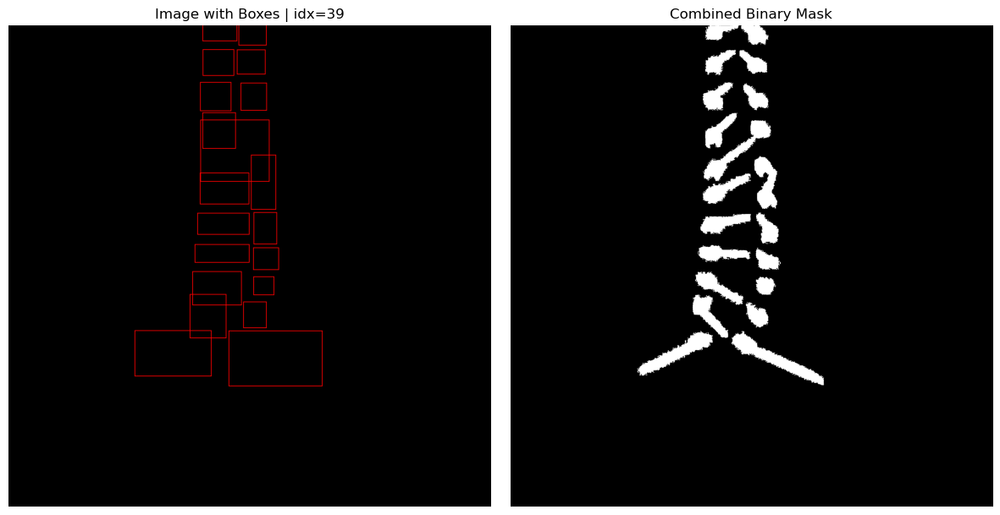

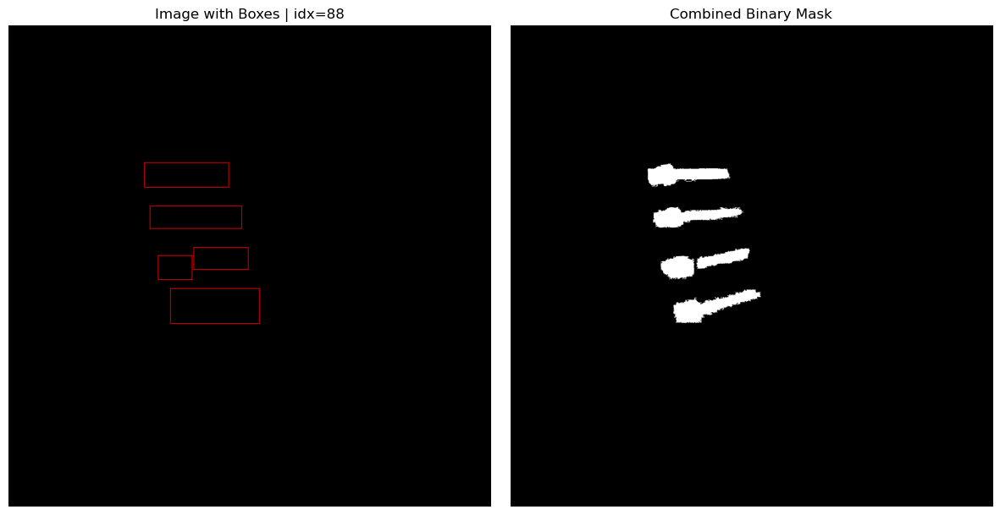

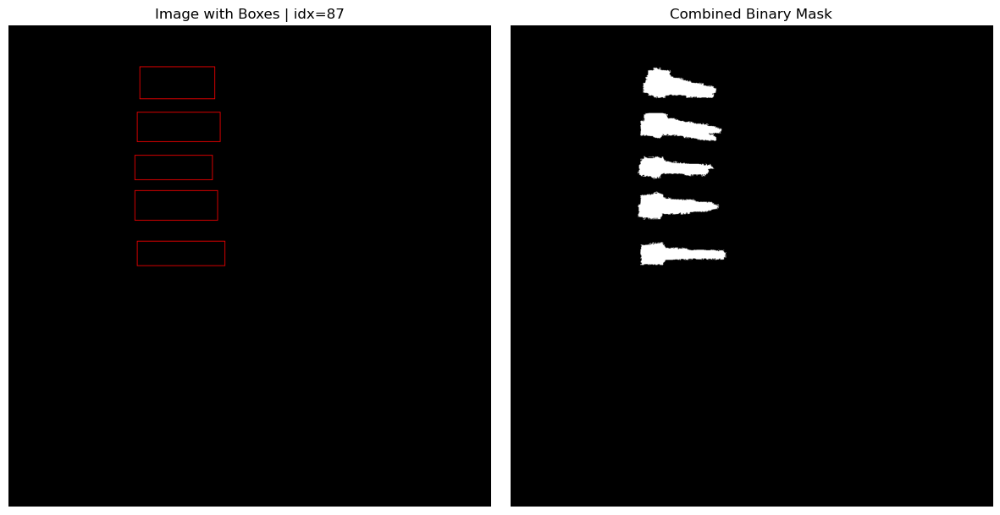

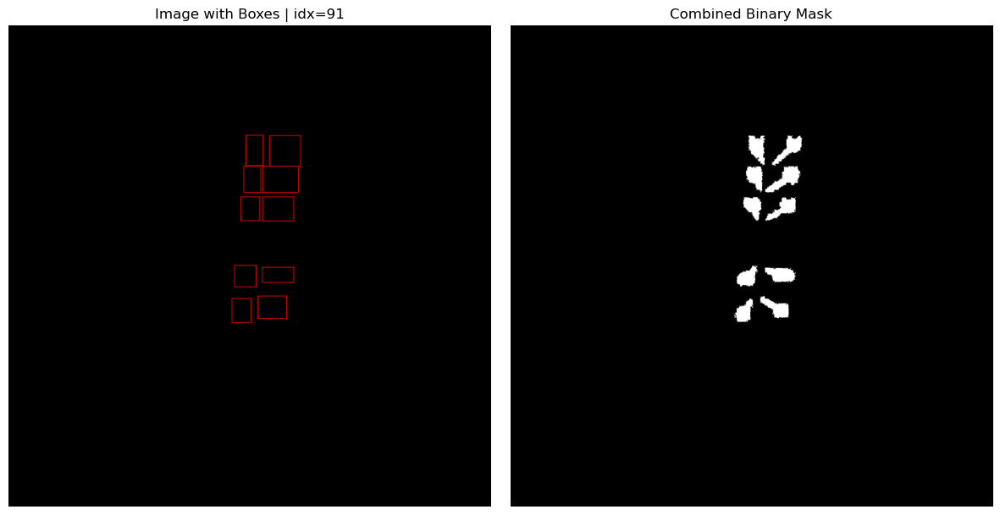

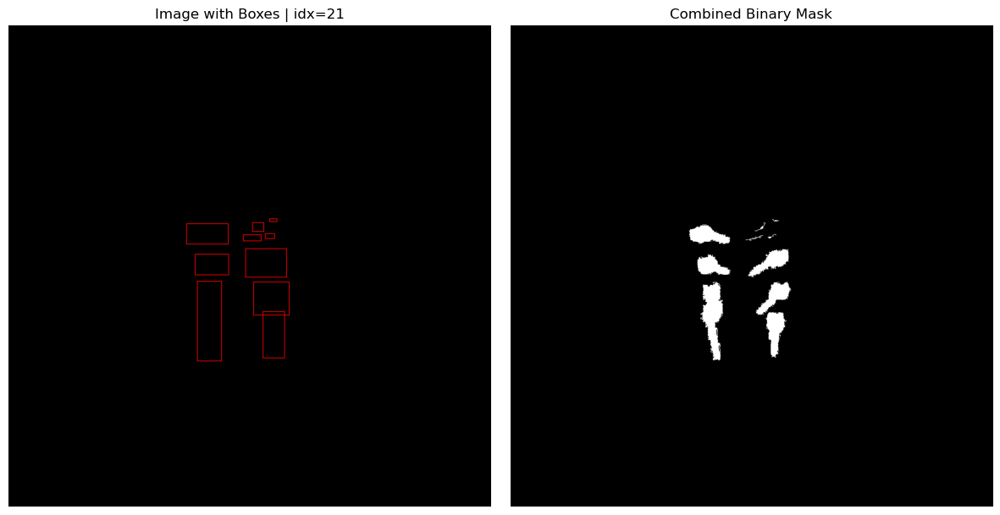

Found 467 images and 467 masks
Manufacturer to label mapping: {'seaspine mariner': 1, 'Depuy expedium (Synthes)': 2, 'Styker everest (K2M)': 3, 'orthofix firebird': 4, 'medtronic solera': 5, 'nuvasive reline': 6}
Found 467 images and 467 masks
Manufacturer to label mapping: {'seaspine mariner': 1, 'Depuy expedium (Synthes)': 2, 'Styker everest (K2M)': 3, 'orthofix firebird': 4, 'medtronic solera': 5, 'nuvasive reline': 6}
Skipped 0 images with no valid masks or labels.
Class counts: [1.0, 179.0, 322.0, 516.0, 330.0, 1346.0, 412.0]
Adjusted class weights: [2.1998097896575928, 0.9586431980133057, 1.9172863960266113, 0.9586431980133057, 0.9586431980133057, 0.0016343311872333288, 0.005339344497770071]

Running debug on first training batch...


/student/sgarimella5/.local/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Epoch 1/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [05:31<00:00,  2.03s/it]

Epoch 1 Training Loss: 1.7297


Epoch 1 Validation Loss: 1.6750

Epoch 2/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [05:11<00:00,  1.91s/it]

Epoch 2 Training Loss: 1.5817


Epoch 2 Validation Loss: 1.5160

Sample 1/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.0000
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.0000
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.8526
  Object 9: IoU with best predicted mask = 0.0000
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.0000
  Object 12: IoU with best predicted mask = 0.8905
  Object 13: IoU with best predicted mask = 0.0000
Average IoU: 0.1341


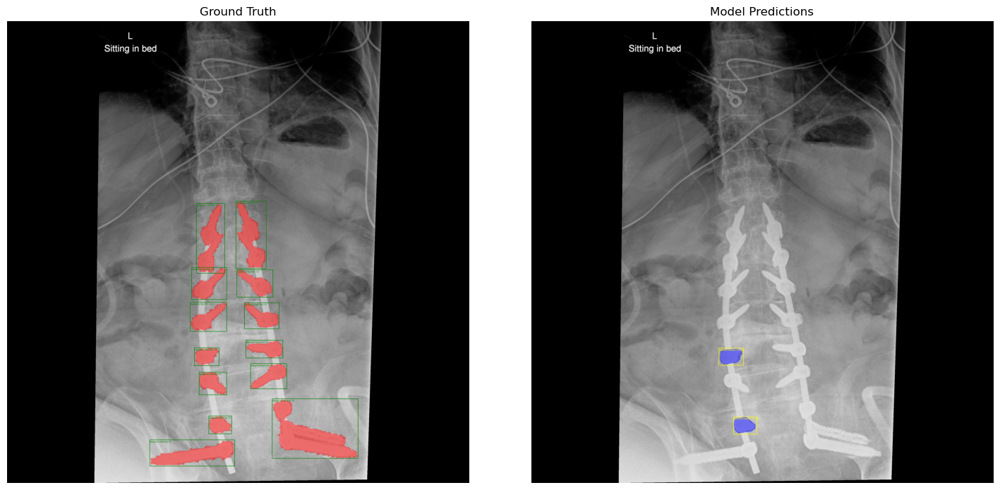


Sample 2/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.0000
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.8507
  Object 6: IoU with best predicted mask = 0.8423
  Object 7: IoU with best predicted mask = 0.8719
  Object 8: IoU with best predicted mask = 0.8343
  Object 9: IoU with best predicted mask = 0.7877
  Object 10: IoU with best predicted mask = 0.9062
Average IoU: 0.5093


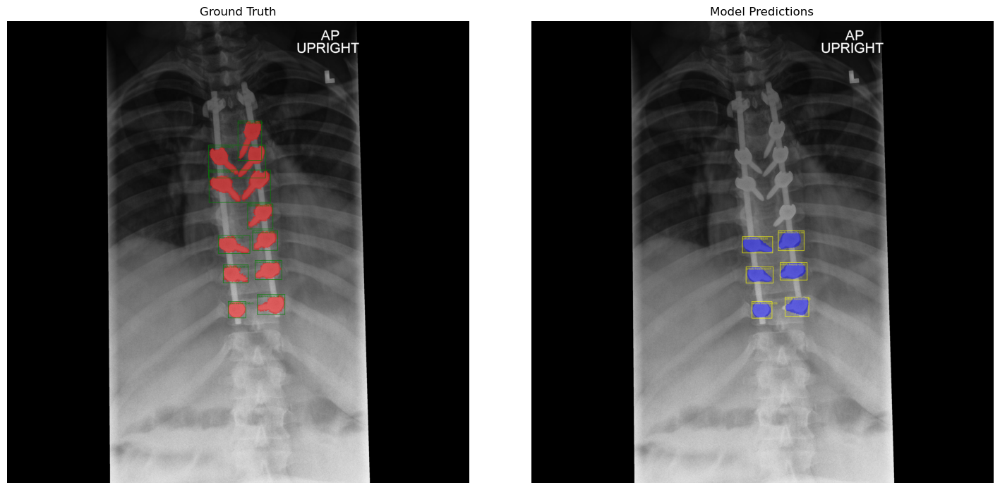


Epoch 3/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [07:31<00:00,  2.77s/it]

Epoch 3 Training Loss: 1.5663


Epoch 3 Validation Loss: 1.5637

Epoch 4/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:39<00:00,  2.45s/it]

Epoch 4 Training Loss: 1.4849


Epoch 4 Validation Loss: 1.4474

Sample 1/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.0000
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.0000
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.7984
  Object 9: IoU with best predicted mask = 0.0000
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.0000
  Object 12: IoU with best predicted mask = 0.0000
  Object 13: IoU with best predicted mask = 0.0000
Average IoU: 0.0614


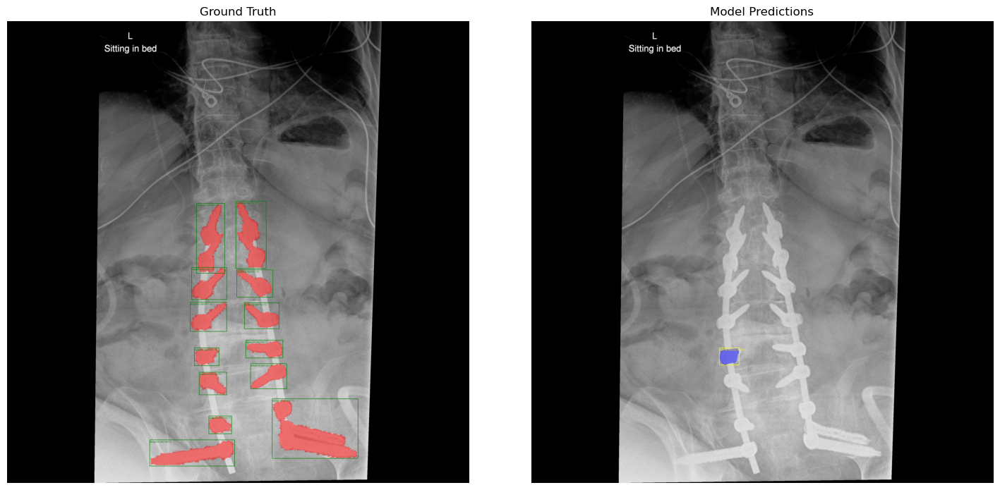


Sample 2/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.0000
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.0000
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.0000
  Object 9: IoU with best predicted mask = 0.0000
  Object 10: IoU with best predicted mask = 0.9030
Average IoU: 0.0903


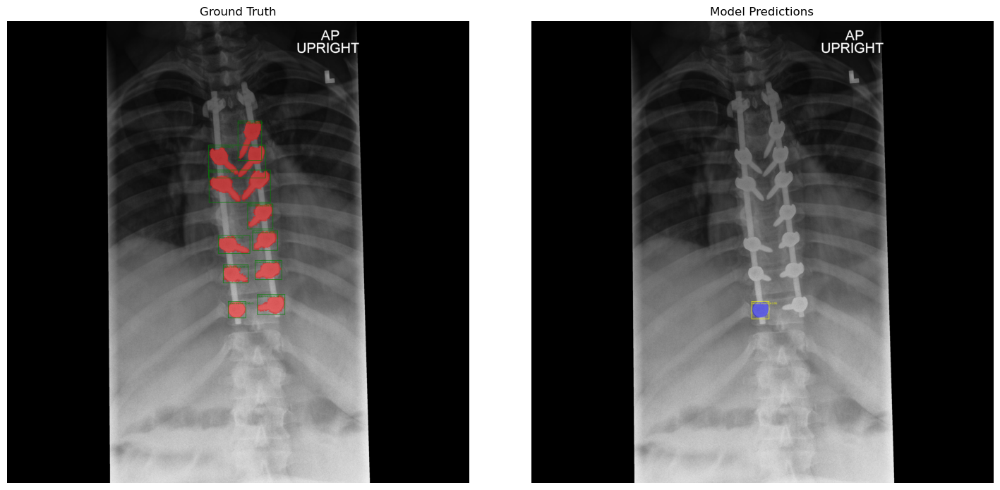


Epoch 5/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:32<00:00,  3.51s/it]


Epoch 5 Training Loss: 1.5014
Checkpoint saved: checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_5.pth
Epoch 5 Validation Loss: 1.2823

Epoch 6/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [08:23<00:00,  3.09s/it]

Epoch 6 Training Loss: 1.4767


Epoch 6 Validation Loss: 1.3593

Sample 1/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.0000
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.0000
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.0000
  Object 9: IoU with best predicted mask = 0.0000
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.7141
  Object 12: IoU with best predicted mask = 0.0000
  Object 13: IoU with best predicted mask = 0.0000
Average IoU: 0.0549


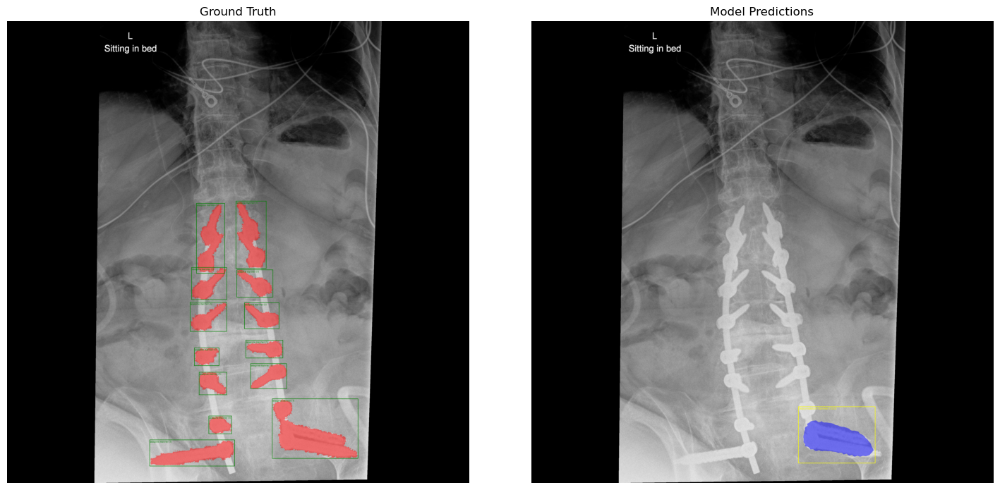


Sample 2/2
  Skipping IoU calculation (missing masks).


/student/sgarimella5/.local/lib/python3.12/site-packages/torchvision/utils.py:215: UserWarning: boxes doesn't contain any box. No box was drawn
  warnings.warn("boxes doesn't contain any box. No box was drawn")
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


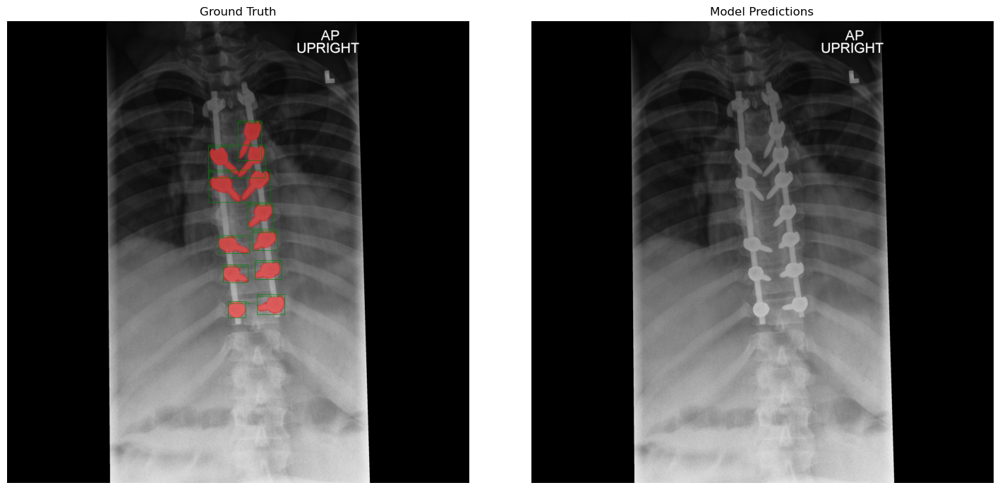


Epoch 7/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:30<00:00,  3.50s/it]

Epoch 7 Training Loss: 1.4658


Epoch 7 Validation Loss: 1.2485

Epoch 8/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:36<00:00,  3.54s/it]

Epoch 8 Training Loss: 1.5481


Epoch 8 Validation Loss: 1.4053

Sample 1/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.5529
  Object 3: IoU with best predicted mask = 0.8330
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.0000
  Object 7: IoU with best predicted mask = 0.8691
  Object 8: IoU with best predicted mask = 0.8669
  Object 9: IoU with best predicted mask = 0.0000
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.0000
  Object 12: IoU with best predicted mask = 0.0000
  Object 13: IoU with best predicted mask = 0.0000
Average IoU: 0.2402


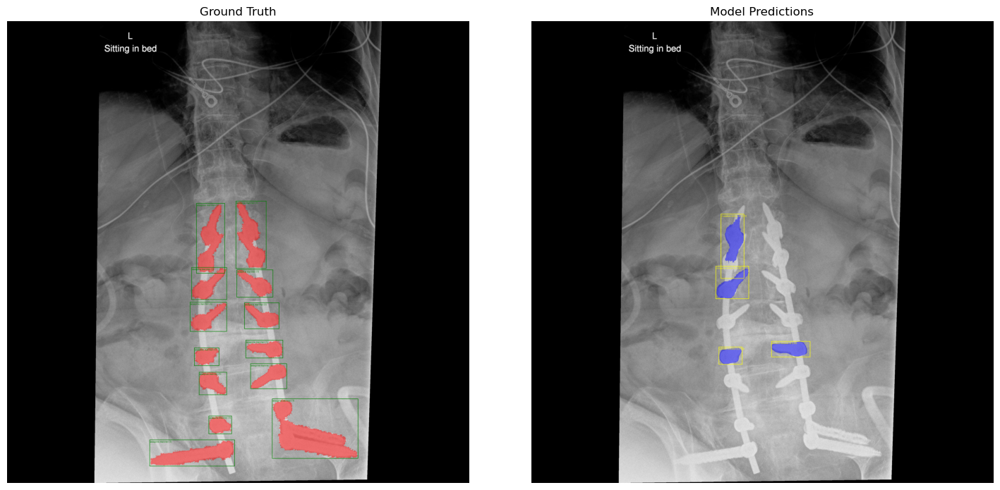


Sample 2/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.3813
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.0000
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.0000
  Object 9: IoU with best predicted mask = 0.0000
  Object 10: IoU with best predicted mask = 0.9110
Average IoU: 0.1292


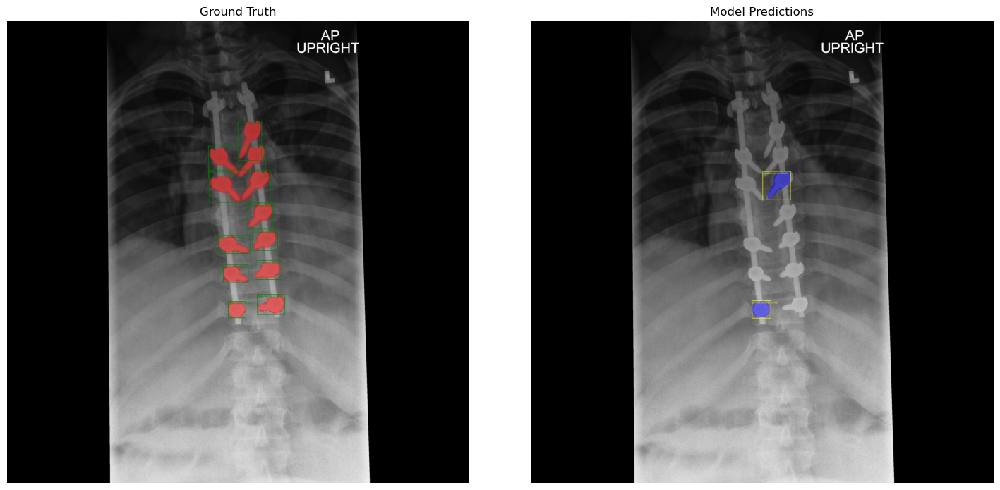


Epoch 9/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:07<00:00,  3.36s/it]

Epoch 9 Training Loss: 1.4556


Epoch 9 Validation Loss: 1.3683

Epoch 10/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:01<00:00,  3.32s/it]


Epoch 10 Training Loss: 1.3580
Checkpoint saved: checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_10.pth
Epoch 10 Validation Loss: 1.3623

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7158
  Object 2: IoU with best predicted mask = 0.6780
  Object 3: IoU with best predicted mask = 0.8442
  Object 4: IoU with best predicted mask = 0.8477
  Object 5: IoU with best predicted mask = 0.8541
  Object 6: IoU with best predicted mask = 0.8631
  Object 7: IoU with best predicted mask = 0.8708
  Object 8: IoU with best predicted mask = 0.8854
  Object 9: IoU with best predicted mask = 0.8137
  Object 10: IoU with best predicted mask = 0.8826
  Object 11: IoU with best predicted mask = 0.7713
  Object 12: IoU with best predicted mask = 0.8962
  Object 13: IoU with best predicted mask = 0.7381
Average IoU: 0.8201


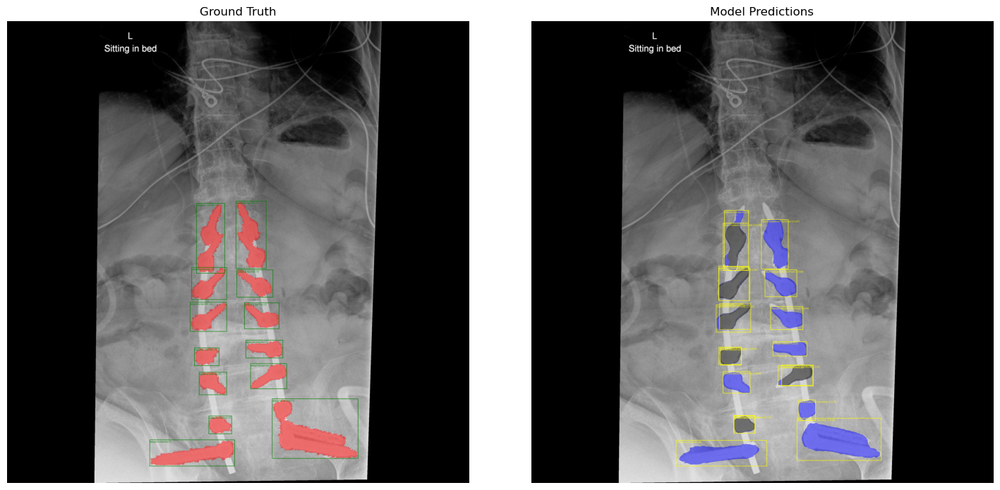


Sample 2/2
  Object 1: IoU with best predicted mask = 0.4696
  Object 2: IoU with best predicted mask = 0.4161
  Object 3: IoU with best predicted mask = 0.4378
  Object 4: IoU with best predicted mask = 0.8434
  Object 5: IoU with best predicted mask = 0.8966
  Object 6: IoU with best predicted mask = 0.8657
  Object 7: IoU with best predicted mask = 0.8748
  Object 8: IoU with best predicted mask = 0.8698
  Object 9: IoU with best predicted mask = 0.8967
  Object 10: IoU with best predicted mask = 0.9016
Average IoU: 0.7472


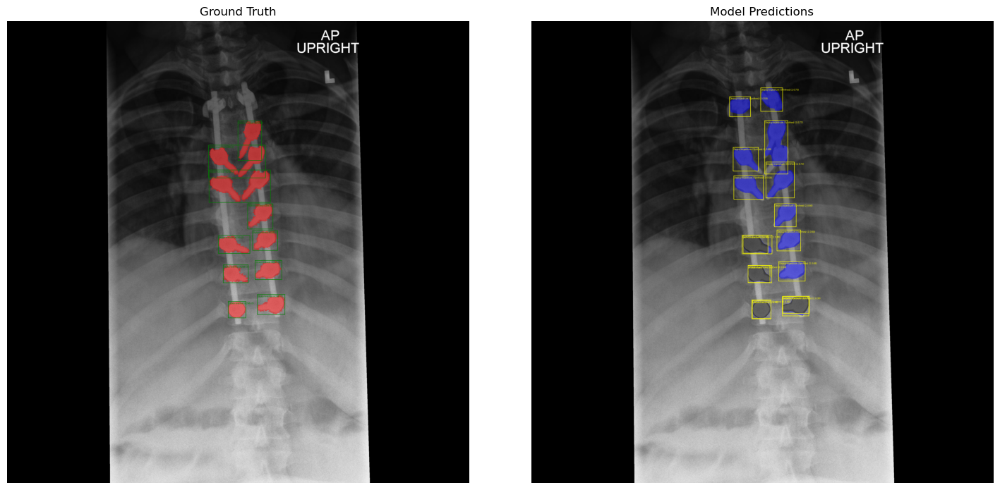


Epoch 11/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:35<00:00,  3.53s/it]

Epoch 11 Training Loss: 1.3175


Epoch 11 Validation Loss: 1.4345

Epoch 12/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [08:51<00:00,  3.26s/it]

Epoch 12 Training Loss: 1.2894


Epoch 12 Validation Loss: 1.2151

Sample 1/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.0000
  Object 3: IoU with best predicted mask = 0.8918
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.8197
  Object 6: IoU with best predicted mask = 0.8694
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.8798
  Object 9: IoU with best predicted mask = 0.9073
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.7489
  Object 12: IoU with best predicted mask = 0.0000
  Object 13: IoU with best predicted mask = 0.8480
Average IoU: 0.4588


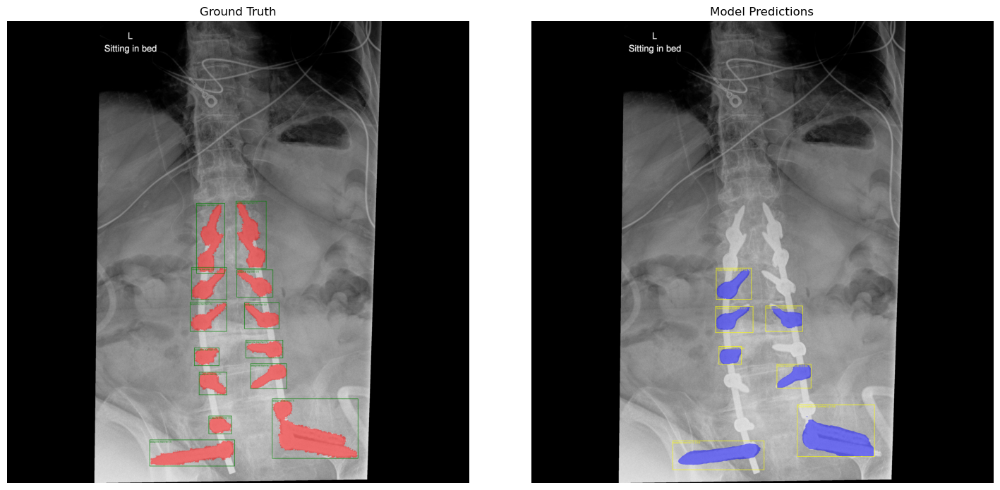


Sample 2/2
  Object 1: IoU with best predicted mask = 0.4935
  Object 2: IoU with best predicted mask = 0.3630
  Object 3: IoU with best predicted mask = 0.4290
  Object 4: IoU with best predicted mask = 0.0000
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.8766
  Object 7: IoU with best predicted mask = 0.0000
  Object 8: IoU with best predicted mask = 0.8645
  Object 9: IoU with best predicted mask = 0.8859
  Object 10: IoU with best predicted mask = 0.9353
Average IoU: 0.4848


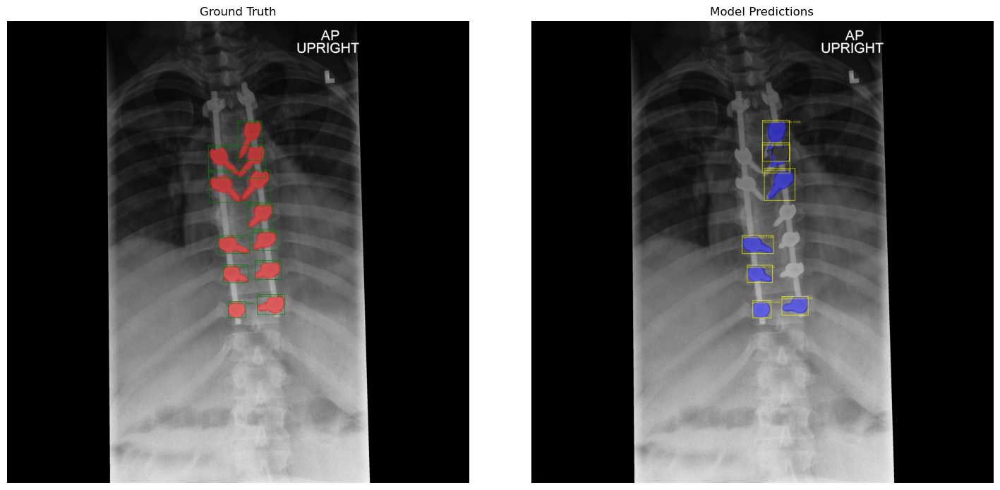


Epoch 13/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [08:44<00:00,  3.22s/it]

Epoch 13 Training Loss: 1.2108


Epoch 13 Validation Loss: 1.2260

Epoch 14/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:06<00:00,  3.36s/it]

Epoch 14 Training Loss: 1.3310


Epoch 14 Validation Loss: 1.1831

Sample 1/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.5712
  Object 3: IoU with best predicted mask = 0.8643
  Object 4: IoU with best predicted mask = 0.8475
  Object 5: IoU with best predicted mask = 0.8625
  Object 6: IoU with best predicted mask = 0.8376
  Object 7: IoU with best predicted mask = 0.8835
  Object 8: IoU with best predicted mask = 0.0000
  Object 9: IoU with best predicted mask = 0.8360
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.7533
  Object 12: IoU with best predicted mask = 0.8749
  Object 13: IoU with best predicted mask = 0.8527
Average IoU: 0.6295


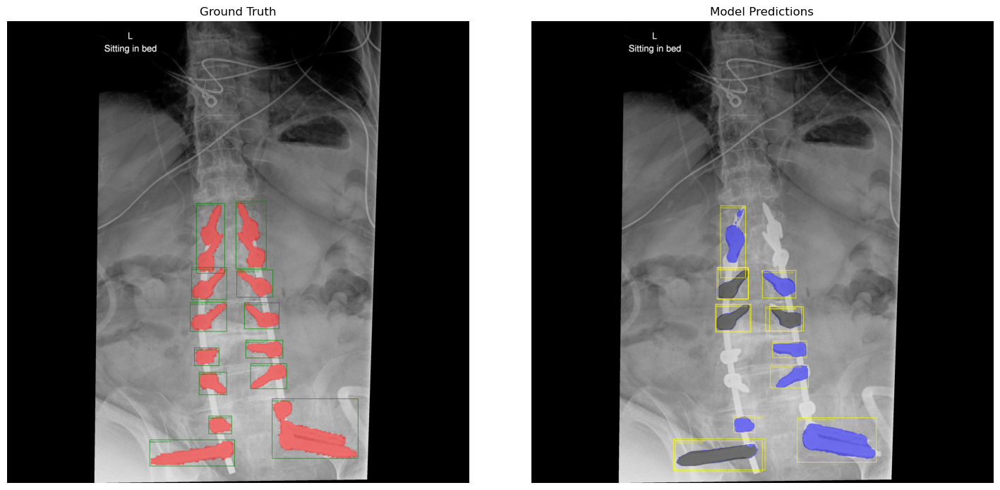


Sample 2/2
  Object 1: IoU with best predicted mask = 0.0454
  Object 2: IoU with best predicted mask = 0.3905
  Object 3: IoU with best predicted mask = 0.4197
  Object 4: IoU with best predicted mask = 0.8370
  Object 5: IoU with best predicted mask = 0.0000
  Object 6: IoU with best predicted mask = 0.7984
  Object 7: IoU with best predicted mask = 0.9044
  Object 8: IoU with best predicted mask = 0.8445
  Object 9: IoU with best predicted mask = 0.8289
  Object 10: IoU with best predicted mask = 0.9346
Average IoU: 0.6003


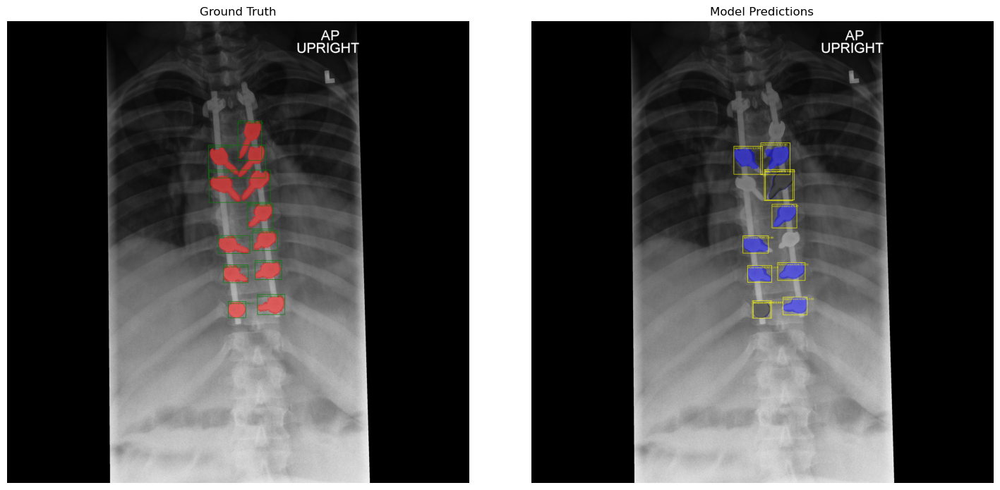


Epoch 15/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:09<00:00,  3.37s/it]


Epoch 15 Training Loss: 1.2153
Checkpoint saved: checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_15.pth
Epoch 15 Validation Loss: 1.1878

Epoch 16/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:12<00:00,  3.39s/it]

Epoch 16 Training Loss: 1.2377


Epoch 16 Validation Loss: 1.1647

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7640
  Object 2: IoU with best predicted mask = 0.6249
  Object 3: IoU with best predicted mask = 0.8863
  Object 4: IoU with best predicted mask = 0.8689
  Object 5: IoU with best predicted mask = 0.8483
  Object 6: IoU with best predicted mask = 0.8436
  Object 7: IoU with best predicted mask = 0.8962
  Object 8: IoU with best predicted mask = 0.8713
  Object 9: IoU with best predicted mask = 0.9125
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.7596
  Object 12: IoU with best predicted mask = 0.9034
  Object 13: IoU with best predicted mask = 0.8390
Average IoU: 0.7706


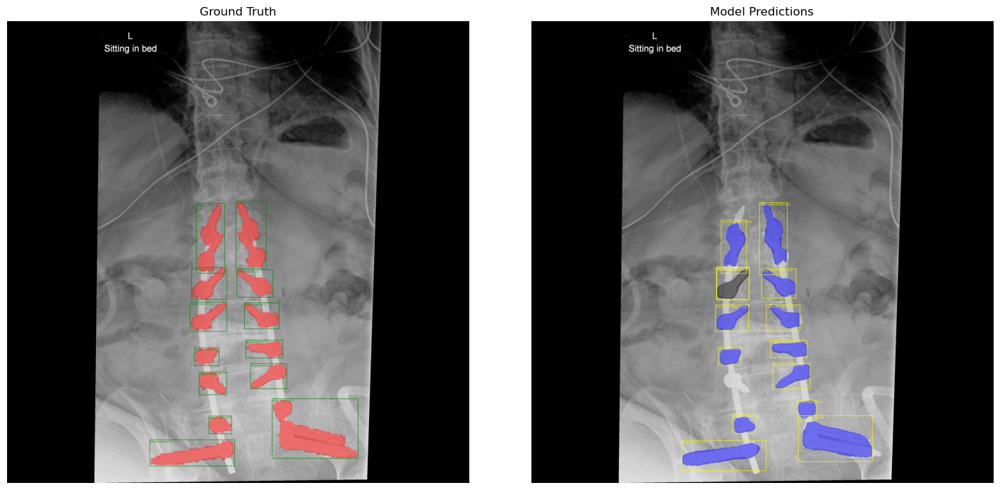


Sample 2/2
  Object 1: IoU with best predicted mask = 0.0000
  Object 2: IoU with best predicted mask = 0.4428
  Object 3: IoU with best predicted mask = 0.4463
  Object 4: IoU with best predicted mask = 0.8672
  Object 5: IoU with best predicted mask = 0.8910
  Object 6: IoU with best predicted mask = 0.8887
  Object 7: IoU with best predicted mask = 0.8977
  Object 8: IoU with best predicted mask = 0.8752
  Object 9: IoU with best predicted mask = 0.8571
  Object 10: IoU with best predicted mask = 0.9228
Average IoU: 0.7089


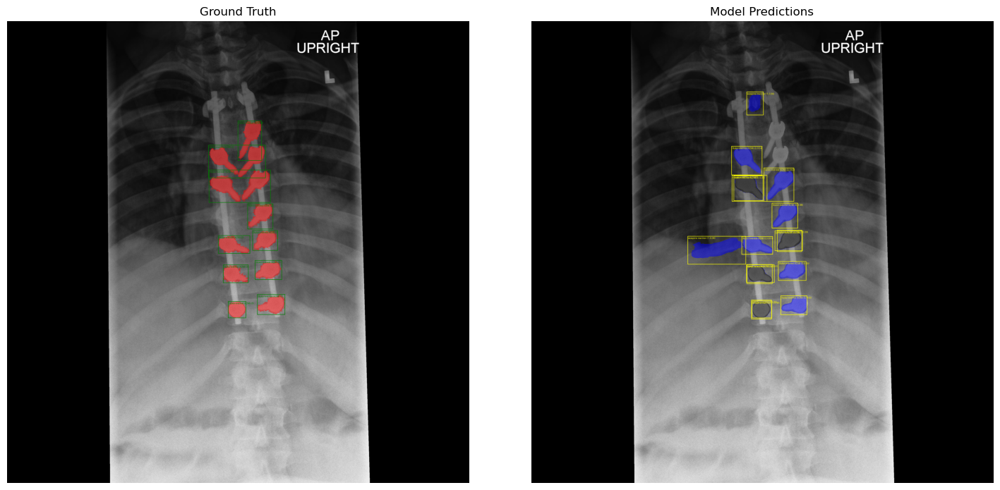


Epoch 17/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [08:54<00:00,  3.28s/it]

Epoch 17 Training Loss: 1.2459


Epoch 17 Validation Loss: 1.2094

Epoch 18/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:16<00:00,  3.41s/it]

Epoch 18 Training Loss: 1.2007


Epoch 18 Validation Loss: 1.1644

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7564
  Object 2: IoU with best predicted mask = 0.6363
  Object 3: IoU with best predicted mask = 0.8476
  Object 4: IoU with best predicted mask = 0.8541
  Object 5: IoU with best predicted mask = 0.8569
  Object 6: IoU with best predicted mask = 0.8696
  Object 7: IoU with best predicted mask = 0.8667
  Object 8: IoU with best predicted mask = 0.8798
  Object 9: IoU with best predicted mask = 0.8961
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.7851
  Object 12: IoU with best predicted mask = 0.8856
  Object 13: IoU with best predicted mask = 0.7773
Average IoU: 0.7624


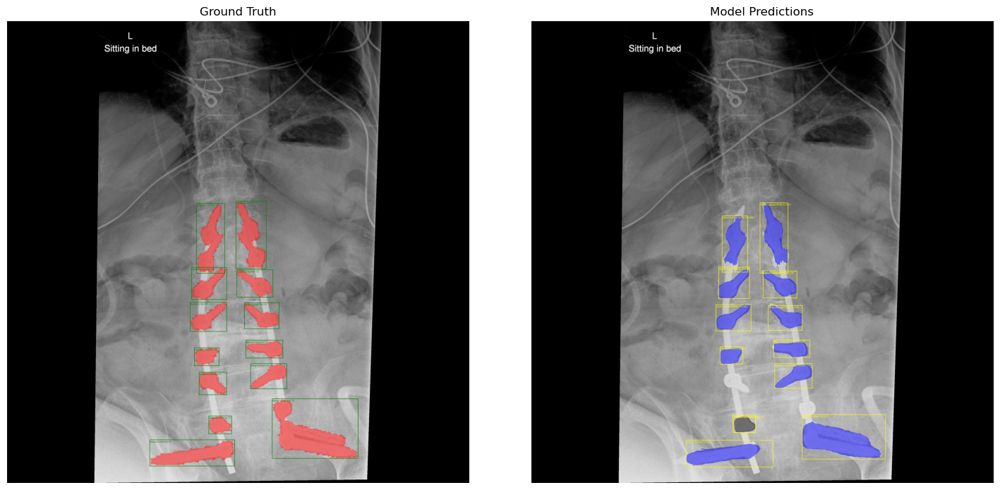


Sample 2/2
  Object 1: IoU with best predicted mask = 0.6500
  Object 2: IoU with best predicted mask = 0.4391
  Object 3: IoU with best predicted mask = 0.4422
  Object 4: IoU with best predicted mask = 0.8499
  Object 5: IoU with best predicted mask = 0.8832
  Object 6: IoU with best predicted mask = 0.8731
  Object 7: IoU with best predicted mask = 0.9020
  Object 8: IoU with best predicted mask = 0.8703
  Object 9: IoU with best predicted mask = 0.8633
  Object 10: IoU with best predicted mask = 0.8946
Average IoU: 0.7668


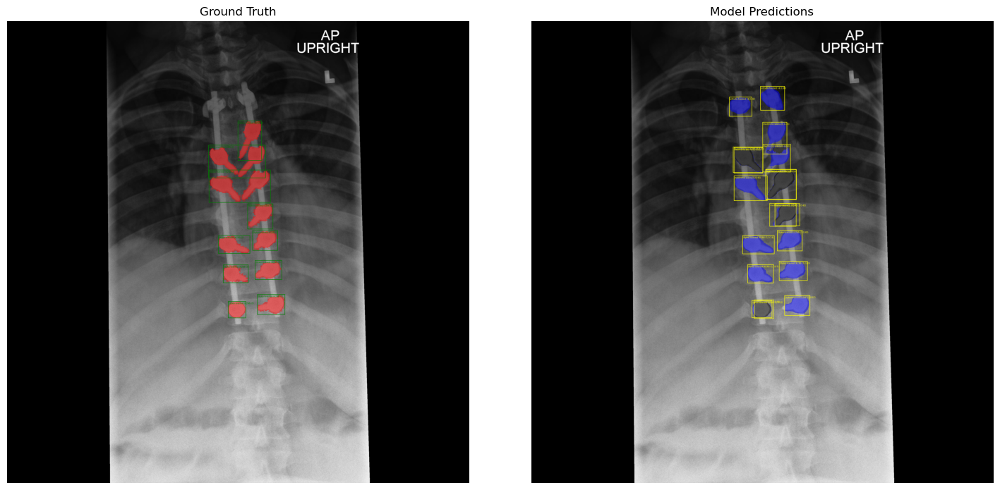


Epoch 19/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:09<00:00,  3.37s/it]

Epoch 19 Training Loss: 1.1691


Epoch 19 Validation Loss: 1.1449

Epoch 20/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [09:13<00:00,  3.39s/it]


Epoch 20 Training Loss: 1.1856
Checkpoint saved: checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_20.pth
Epoch 20 Validation Loss: 1.2065

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7104
  Object 2: IoU with best predicted mask = 0.5810
  Object 3: IoU with best predicted mask = 0.8634
  Object 4: IoU with best predicted mask = 0.8744
  Object 5: IoU with best predicted mask = 0.8424
  Object 6: IoU with best predicted mask = 0.7518
  Object 7: IoU with best predicted mask = 0.8889
  Object 8: IoU with best predicted mask = 0.8796
  Object 9: IoU with best predicted mask = 0.8830
  Object 10: IoU with best predicted mask = 0.8936
  Object 11: IoU with best predicted mask = 0.7634
  Object 12: IoU with best predicted mask = 0.8901
  Object 13: IoU with best predicted mask = 0.8073
Average IoU: 0.8176


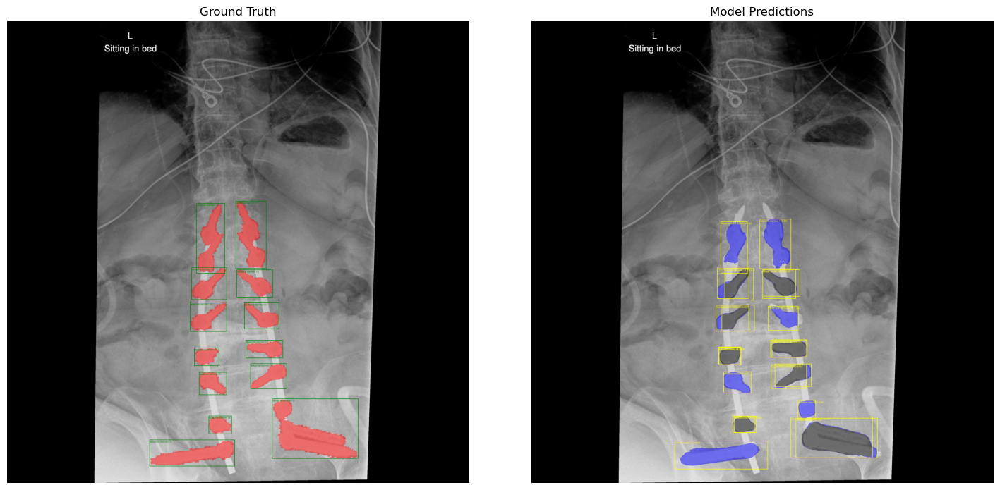


Sample 2/2
  Object 1: IoU with best predicted mask = 0.3884
  Object 2: IoU with best predicted mask = 0.3721
  Object 3: IoU with best predicted mask = 0.4322
  Object 4: IoU with best predicted mask = 0.8636
  Object 5: IoU with best predicted mask = 0.8978
  Object 6: IoU with best predicted mask = 0.8677
  Object 7: IoU with best predicted mask = 0.8955
  Object 8: IoU with best predicted mask = 0.8682
  Object 9: IoU with best predicted mask = 0.8504
  Object 10: IoU with best predicted mask = 0.9368
Average IoU: 0.7373


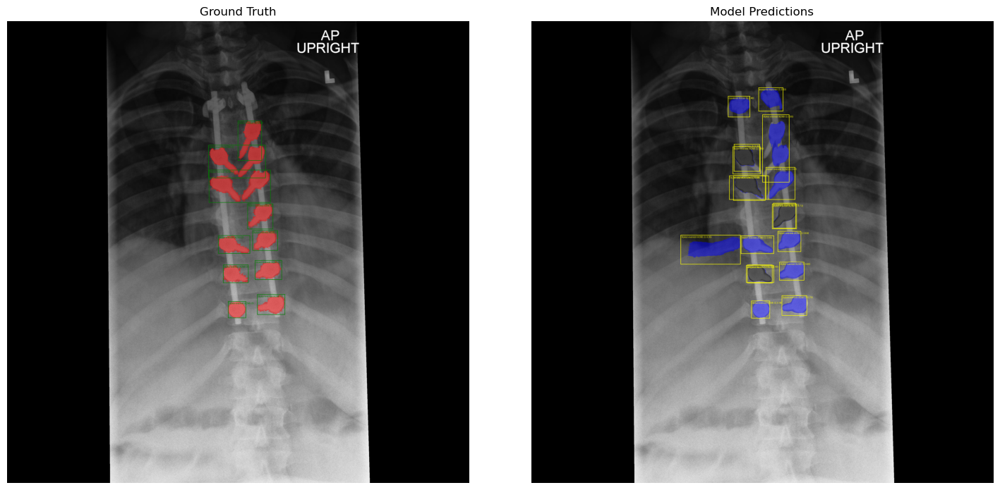


Epoch 21/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [05:52<00:00,  2.16s/it]

Epoch 21 Training Loss: 1.1791


Epoch 21 Validation Loss: 1.1967

Epoch 22/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [05:53<00:00,  2.17s/it]

Epoch 22 Training Loss: 1.1065


Epoch 22 Validation Loss: 1.1020

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7464
  Object 2: IoU with best predicted mask = 0.6446
  Object 3: IoU with best predicted mask = 0.8638
  Object 4: IoU with best predicted mask = 0.8574
  Object 5: IoU with best predicted mask = 0.8559
  Object 6: IoU with best predicted mask = 0.8215
  Object 7: IoU with best predicted mask = 0.8470
  Object 8: IoU with best predicted mask = 0.8644
  Object 9: IoU with best predicted mask = 0.8869
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.7696
  Object 12: IoU with best predicted mask = 0.8986
  Object 13: IoU with best predicted mask = 0.7936
Average IoU: 0.7577


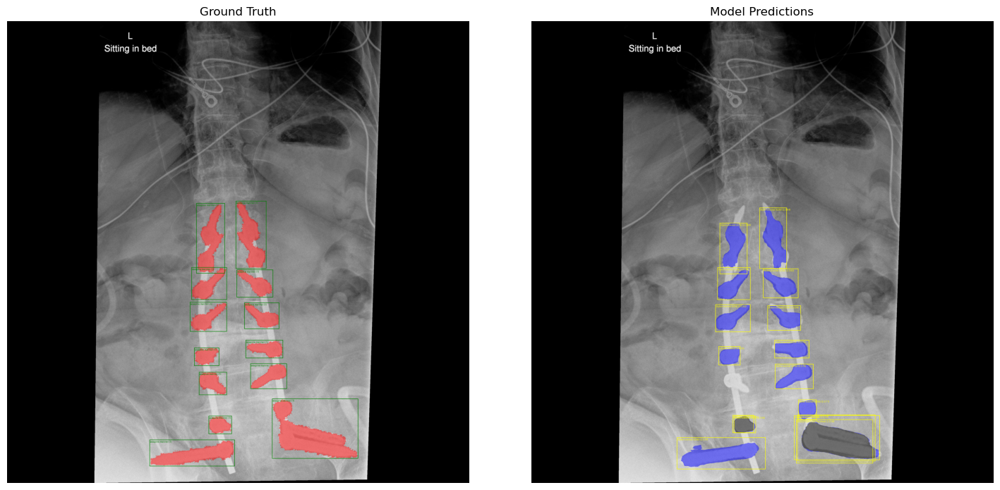


Sample 2/2
  Object 1: IoU with best predicted mask = 0.4943
  Object 2: IoU with best predicted mask = 0.3909
  Object 3: IoU with best predicted mask = 0.4515
  Object 4: IoU with best predicted mask = 0.8563
  Object 5: IoU with best predicted mask = 0.8811
  Object 6: IoU with best predicted mask = 0.8579
  Object 7: IoU with best predicted mask = 0.8751
  Object 8: IoU with best predicted mask = 0.8618
  Object 9: IoU with best predicted mask = 0.8510
  Object 10: IoU with best predicted mask = 0.9020
Average IoU: 0.7422


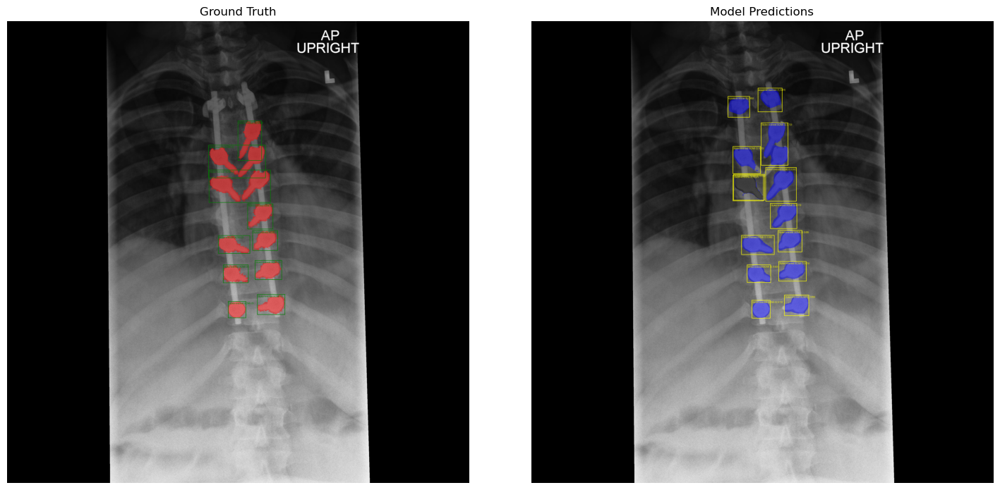


Epoch 23/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:59<00:00,  2.57s/it]

Epoch 23 Training Loss: 1.0881


Epoch 23 Validation Loss: 1.1901

Epoch 24/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:20<00:00,  2.33s/it]

Epoch 24 Training Loss: 1.0479


Epoch 24 Validation Loss: 1.1677

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7807
  Object 2: IoU with best predicted mask = 0.6775
  Object 3: IoU with best predicted mask = 0.8752
  Object 4: IoU with best predicted mask = 0.8429
  Object 5: IoU with best predicted mask = 0.8369
  Object 6: IoU with best predicted mask = 0.8886
  Object 7: IoU with best predicted mask = 0.8892
  Object 8: IoU with best predicted mask = 0.8856
  Object 9: IoU with best predicted mask = 0.9097
  Object 10: IoU with best predicted mask = 0.8909
  Object 11: IoU with best predicted mask = 0.1261
  Object 12: IoU with best predicted mask = 0.9007
  Object 13: IoU with best predicted mask = 0.6766
Average IoU: 0.7831


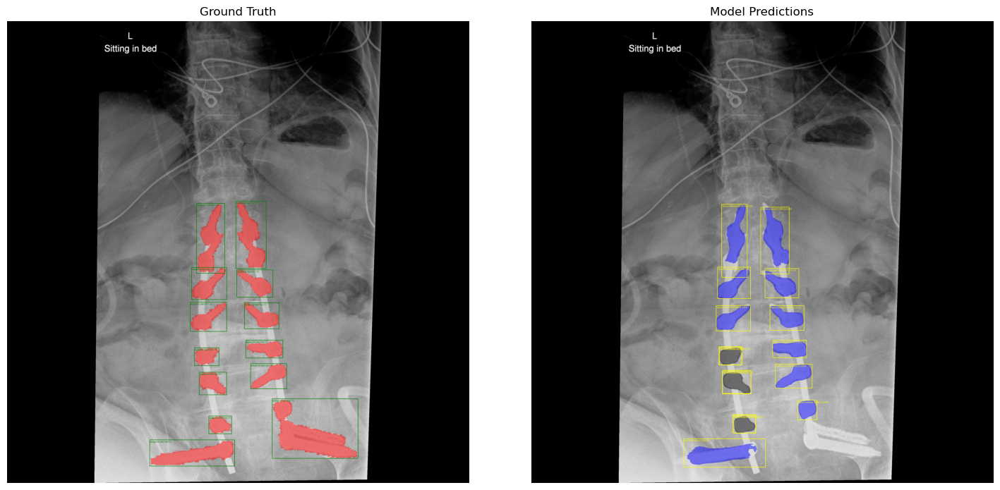


Sample 2/2
  Object 1: IoU with best predicted mask = 0.5159
  Object 2: IoU with best predicted mask = 0.3846
  Object 3: IoU with best predicted mask = 0.4405
  Object 4: IoU with best predicted mask = 0.8707
  Object 5: IoU with best predicted mask = 0.8935
  Object 6: IoU with best predicted mask = 0.8552
  Object 7: IoU with best predicted mask = 0.8860
  Object 8: IoU with best predicted mask = 0.8561
  Object 9: IoU with best predicted mask = 0.8833
  Object 10: IoU with best predicted mask = 0.9032
Average IoU: 0.7489


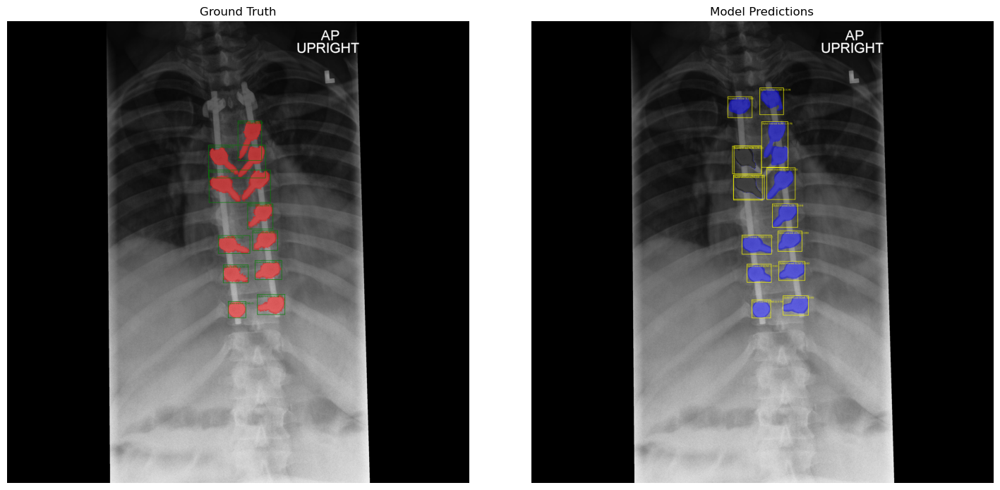


Epoch 25/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:48<00:00,  2.51s/it]


Epoch 25 Training Loss: 1.1605
Checkpoint saved: checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_25.pth
Epoch 25 Validation Loss: 1.1732

Epoch 26/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:44<00:00,  2.48s/it]

Epoch 26 Training Loss: 1.0957


Epoch 26 Validation Loss: 1.1928

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7414
  Object 2: IoU with best predicted mask = 0.6946
  Object 3: IoU with best predicted mask = 0.8746
  Object 4: IoU with best predicted mask = 0.8694
  Object 5: IoU with best predicted mask = 0.8382
  Object 6: IoU with best predicted mask = 0.8619
  Object 7: IoU with best predicted mask = 0.8709
  Object 8: IoU with best predicted mask = 0.8870
  Object 9: IoU with best predicted mask = 0.8926
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.1261
  Object 12: IoU with best predicted mask = 0.8939
  Object 13: IoU with best predicted mask = 0.0000
Average IoU: 0.6577


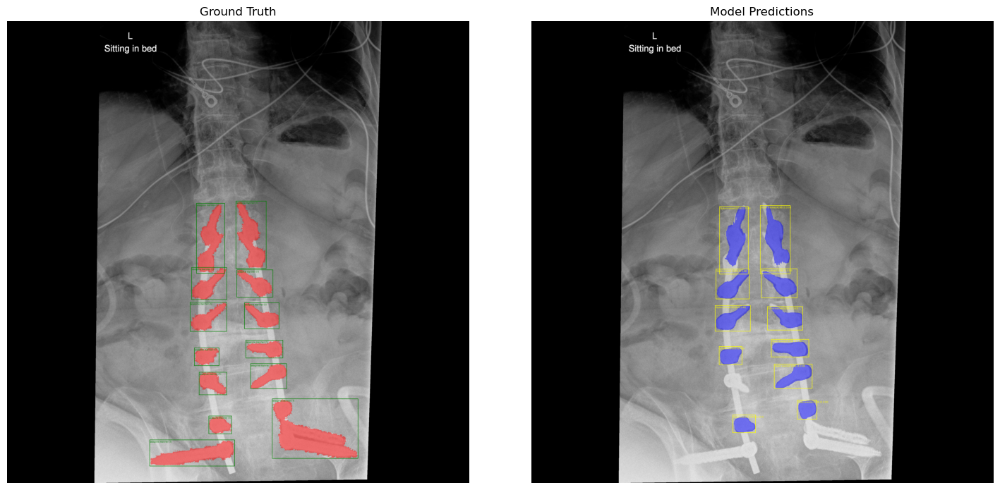


Sample 2/2
  Object 1: IoU with best predicted mask = 0.4802
  Object 2: IoU with best predicted mask = 0.3647
  Object 3: IoU with best predicted mask = 0.4453
  Object 4: IoU with best predicted mask = 0.8525
  Object 5: IoU with best predicted mask = 0.8911
  Object 6: IoU with best predicted mask = 0.8786
  Object 7: IoU with best predicted mask = 0.8857
  Object 8: IoU with best predicted mask = 0.8661
  Object 9: IoU with best predicted mask = 0.8965
  Object 10: IoU with best predicted mask = 0.9140
Average IoU: 0.7474


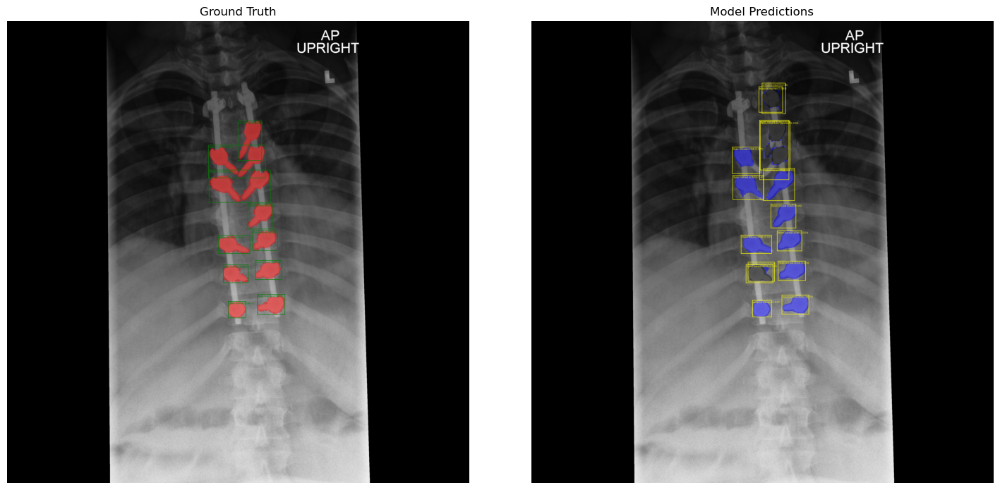


Epoch 27/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:42<00:00,  2.47s/it]

Epoch 27 Training Loss: 1.1065


Epoch 27 Validation Loss: 1.1437

Epoch 28/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:32<00:00,  2.41s/it]

Epoch 28 Training Loss: 1.0124


Epoch 28 Validation Loss: 1.2276

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7669
  Object 2: IoU with best predicted mask = 0.6781
  Object 3: IoU with best predicted mask = 0.8676
  Object 4: IoU with best predicted mask = 0.8598
  Object 5: IoU with best predicted mask = 0.8196
  Object 6: IoU with best predicted mask = 0.8720
  Object 7: IoU with best predicted mask = 0.8854
  Object 8: IoU with best predicted mask = 0.8861
  Object 9: IoU with best predicted mask = 0.9078
  Object 10: IoU with best predicted mask = 0.8896
  Object 11: IoU with best predicted mask = 0.7672
  Object 12: IoU with best predicted mask = 0.8938
  Object 13: IoU with best predicted mask = 0.7768
Average IoU: 0.8362


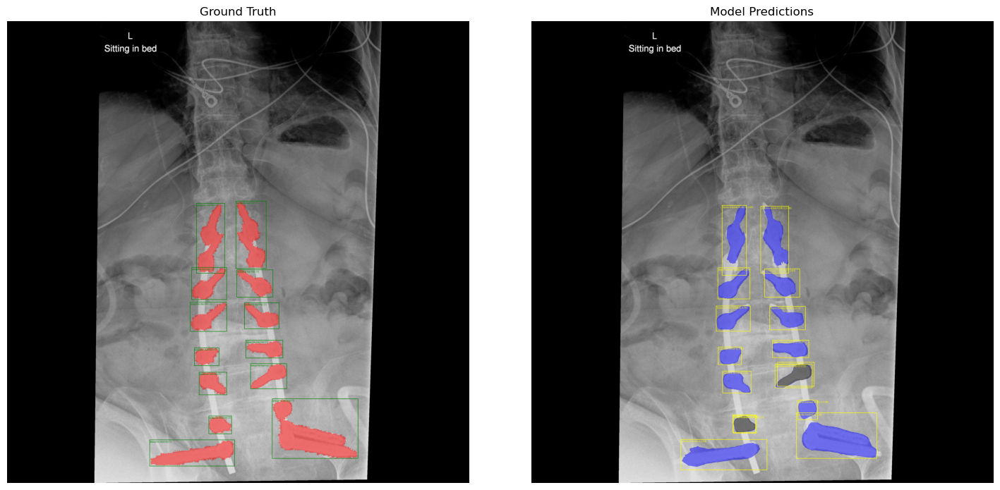


Sample 2/2
  Object 1: IoU with best predicted mask = 0.5268
  Object 2: IoU with best predicted mask = 0.3639
  Object 3: IoU with best predicted mask = 0.4354
  Object 4: IoU with best predicted mask = 0.8564
  Object 5: IoU with best predicted mask = 0.8937
  Object 6: IoU with best predicted mask = 0.8615
  Object 7: IoU with best predicted mask = 0.9039
  Object 8: IoU with best predicted mask = 0.8562
  Object 9: IoU with best predicted mask = 0.8983
  Object 10: IoU with best predicted mask = 0.0000
Average IoU: 0.6596


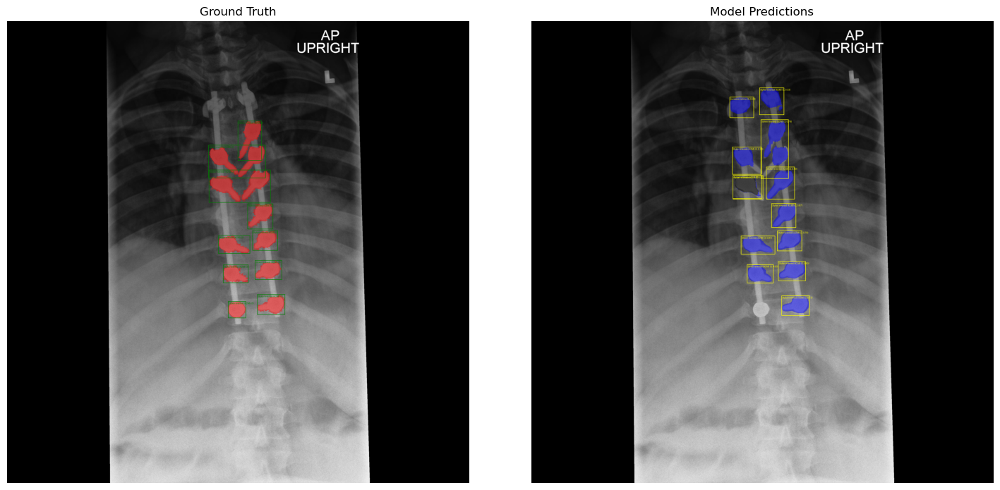


Epoch 29/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [07:14<00:00,  2.67s/it]

Epoch 29 Training Loss: 1.0059


Epoch 29 Validation Loss: 1.1904

Epoch 30/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:51<00:00,  2.52s/it]


Epoch 30 Training Loss: 1.0257
Checkpoint saved: checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_30.pth
Epoch 30 Validation Loss: 1.1325

Sample 1/2
  Object 1: IoU with best predicted mask = 0.7814
  Object 2: IoU with best predicted mask = 0.6052
  Object 3: IoU with best predicted mask = 0.8777
  Object 4: IoU with best predicted mask = 0.8455
  Object 5: IoU with best predicted mask = 0.8466
  Object 6: IoU with best predicted mask = 0.8650
  Object 7: IoU with best predicted mask = 0.8889
  Object 8: IoU with best predicted mask = 0.8902
  Object 9: IoU with best predicted mask = 0.8968
  Object 10: IoU with best predicted mask = 0.0000
  Object 11: IoU with best predicted mask = 0.1277
  Object 12: IoU with best predicted mask = 0.8909
  Object 13: IoU with best predicted mask = 0.0000
Average IoU: 0.6551


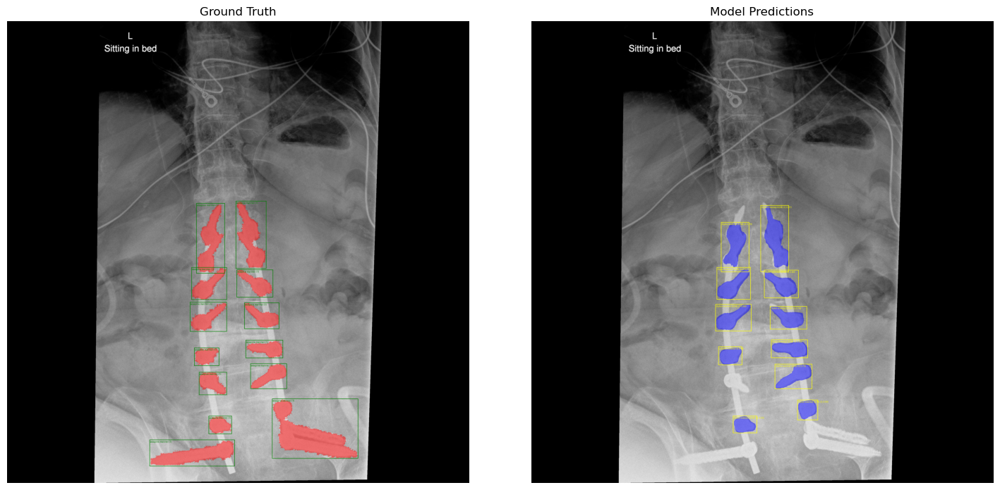


Sample 2/2
  Object 1: IoU with best predicted mask = 0.4500
  Object 2: IoU with best predicted mask = 0.3845
  Object 3: IoU with best predicted mask = 0.4454
  Object 4: IoU with best predicted mask = 0.8743
  Object 5: IoU with best predicted mask = 0.8957
  Object 6: IoU with best predicted mask = 0.8675
  Object 7: IoU with best predicted mask = 0.8917
  Object 8: IoU with best predicted mask = 0.8725
  Object 9: IoU with best predicted mask = 0.8826
  Object 10: IoU with best predicted mask = 0.8825
Average IoU: 0.7447


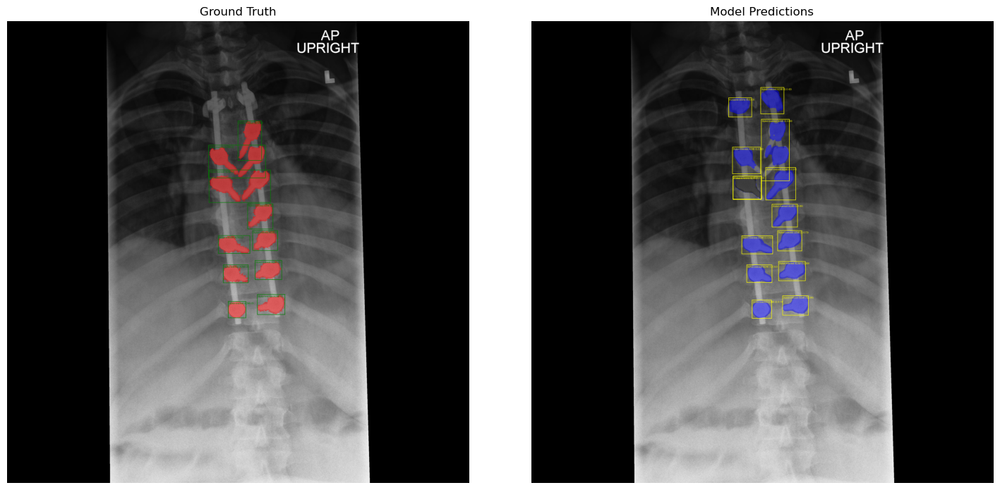


Epoch 31/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:39<00:00,  2.45s/it]

Epoch 31 Training Loss: 1.0211


Epoch 31 Validation Loss: 1.1318

Epoch 32/250


Training: 100%|███████████████████████████████████████████████████████████| 163/163 [06:36<00:00,  2.43s/it]

Epoch 32 Training Loss: 0.8911


Epoch 32 Validation Loss: 1.1760
Early stopping triggered at epoch 32


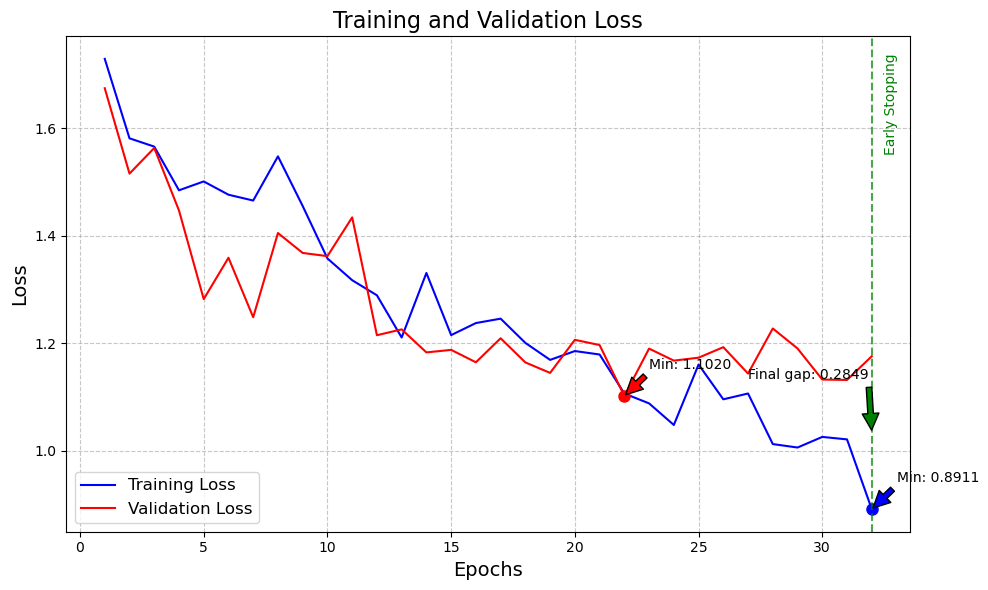

✅ Final model saved at checkpoints_improved_random_sampler_new_v1/final_model_checkpoint_random_sampler.pth

📊 Evaluating final model...


Evaluating: 100%|███████████████████████████████████████████████████████████| 48/48 [00:52<00:00,  1.09s/it]



--- Per-Screw Classification Report ---
              precision    recall  f1-score   support

           1       0.83      0.19      0.30        27
           2       0.45      0.15      0.23        60
           3       0.28      0.53      0.37        36
           4       0.83      0.57      0.68        61
           5       0.74      0.66      0.70       102
           6       0.33      0.46      0.39        24
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0

   micro avg       0.56      0.47      0.51       310
   macro avg       0.43      0.32      0.33       310
weighted avg       0.63      0.47      0.51       310

Confusion Matrix:
[[ 5  1  4  1  0 10  0  0]
 [ 0  9 20  2 12  4  0  0]
 [ 1  0 19  0 11  4  0  0]
 [ 0  6  9 35  0  0  0  0]
 [ 0  4 14  3 67  4  0  0]
 [ 0  0  2  1  0 11  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]]

Per-screw Accuracy: 47.10%

📊 Evaluating with voting aggregation...


Evaluating with voting: 100%|███████████████████████████████████████████████| 48/48 [00:52<00:00,  1.09s/it]


--- Per-Screw Classification Report ---
              precision    recall  f1-score   support

           1       0.83      0.19      0.30        27
           2       0.45      0.15      0.23        60
           3       0.28      0.53      0.37        36
           4       0.83      0.57      0.68        61
           5       0.74      0.66      0.70       102
           6       0.33      0.46      0.39        24

   micro avg       0.56      0.47      0.51       310
   macro avg       0.58      0.43      0.44       310
weighted avg       0.63      0.47      0.51       310

Confusion Matrix:
[[ 5  1  4  1  0 10]
 [ 0  9 20  2 12  4]
 [ 1  0 19  0 11  4]
 [ 0  6  9 35  0  0]
 [ 0  4 14  3 67  4]
 [ 0  0  2  1  0 11]]

--- Accuracy Summary ---
Per-screw classification accuracy: 47.10%
Aggregate (per-X-ray) accuracy: 56.25%

🟡 Visualizing model predictions on test set...



Sample 1/5
  Object 1: IoU with best predicted mask = 0.7669
  Object 2: IoU with best predicted mask = 0.8597
  Object 3: IoU with best predicted mask = 0.7780
  Object 4: IoU with best predicted mask = 0.8546
  Object 5: IoU with best predicted mask = 0.8416
  Object 6: IoU with best predicted mask = 0.8072
  Object 7: IoU with best predicted mask = 0.7397
  Object 8: IoU with best predicted mask = 0.8385
  Object 9: IoU with best predicted mask = 0.8612
  Object 10: IoU with best predicted mask = 0.7331
  Object 11: IoU with best predicted mask = 0.5643
  Object 12: IoU with best predicted mask = 0.8749
  Object 13: IoU with best predicted mask = 0.7644
  Object 14: IoU with best predicted mask = 0.6853
Average IoU: 0.7835


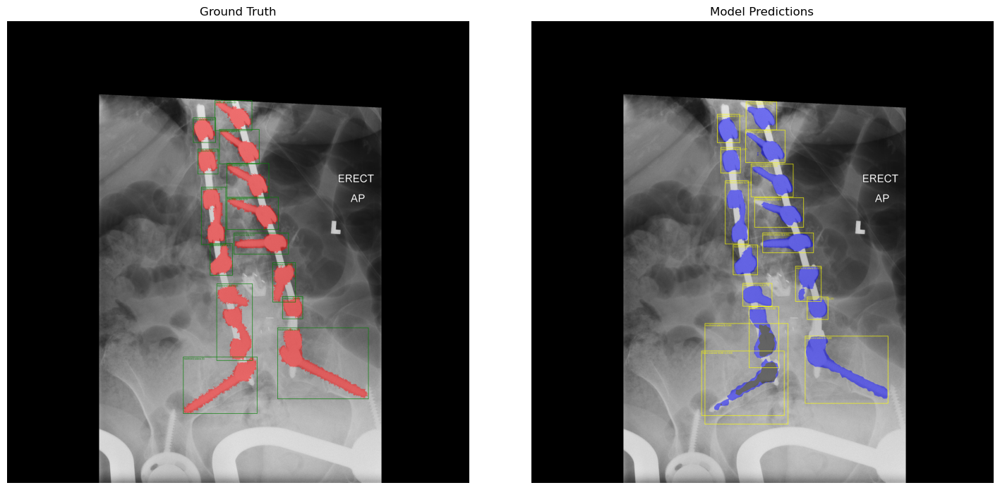


Sample 2/5
  Object 1: IoU with best predicted mask = 0.4203
  Object 2: IoU with best predicted mask = 0.2942
  Object 3: IoU with best predicted mask = 0.2870
  Object 4: IoU with best predicted mask = 0.5220
  Object 5: IoU with best predicted mask = 0.9178
  Object 6: IoU with best predicted mask = 0.7629
  Object 7: IoU with best predicted mask = 0.8849
  Object 8: IoU with best predicted mask = 0.8483
Average IoU: 0.6172


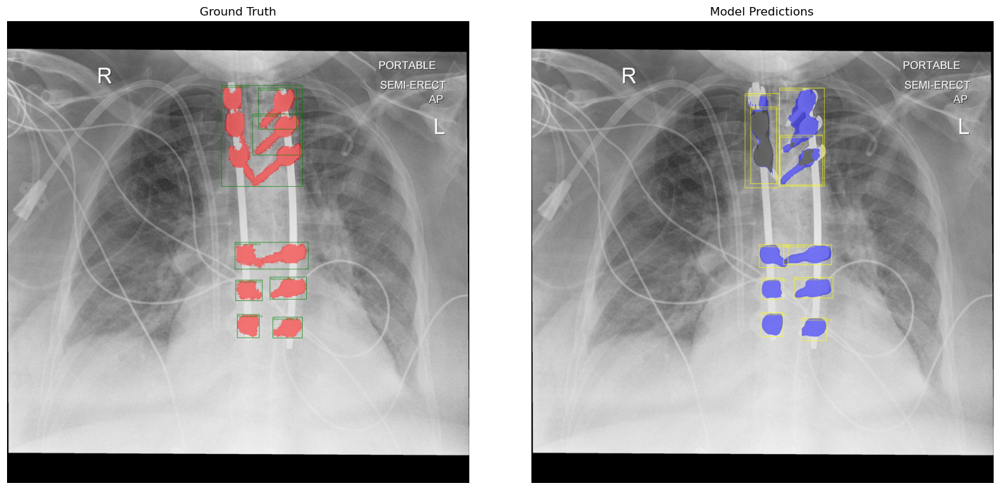


Sample 3/5
  Object 1: IoU with best predicted mask = 0.8030
  Object 2: IoU with best predicted mask = 0.7469
  Object 3: IoU with best predicted mask = 0.7907
  Object 4: IoU with best predicted mask = 0.7737
  Object 5: IoU with best predicted mask = 0.8612
  Object 6: IoU with best predicted mask = 0.9052
  Object 7: IoU with best predicted mask = 0.8449
  Object 8: IoU with best predicted mask = 0.8545
  Object 9: IoU with best predicted mask = 0.6822
  Object 10: IoU with best predicted mask = 0.5232
Average IoU: 0.7786


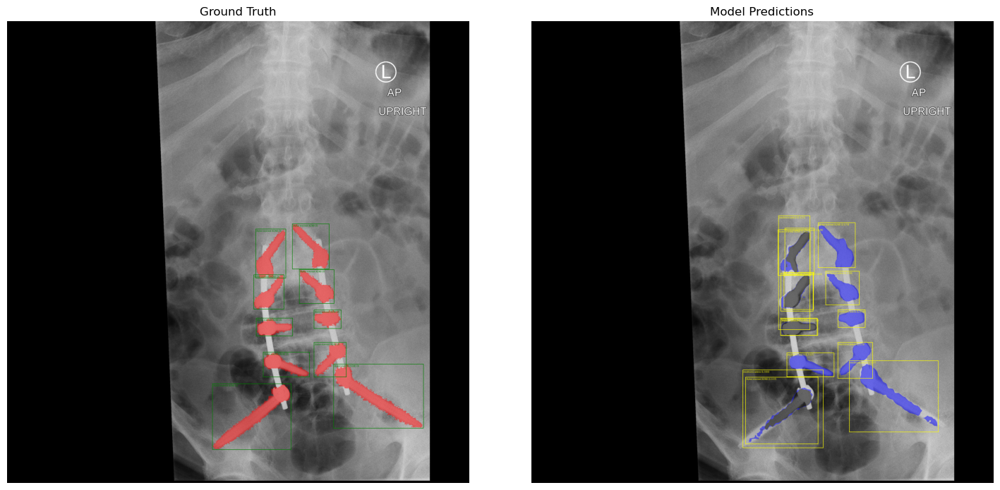


Sample 4/5
  Object 1: IoU with best predicted mask = 0.8975
  Object 2: IoU with best predicted mask = 0.8926
  Object 3: IoU with best predicted mask = 0.8900
Average IoU: 0.8934


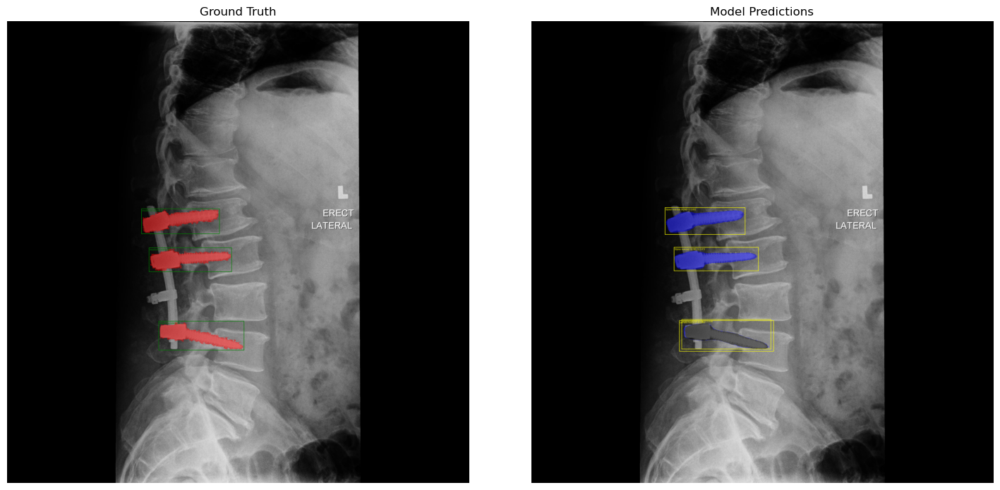


Sample 5/5
  Object 1: IoU with best predicted mask = 0.8797
  Object 2: IoU with best predicted mask = 0.8532
Average IoU: 0.8664


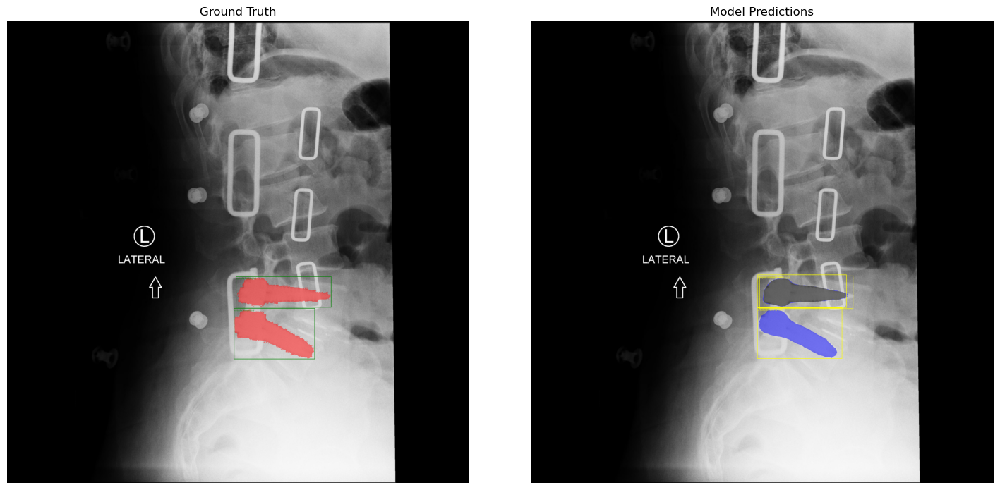


=== Model Summary ===
Total parameters: 30,927,880
Trainable parameters: 30,771,016
Architecture: Mask R-CNN with ResNet18-FPN backbone
Number of classes: 7 (including background)
Class mapping: {'seaspine mariner': 1, 'Depuy expedium (Synthes)': 2, 'Styker everest (K2M)': 3, 'orthofix firebird': 4, 'medtronic solera': 5, 'nuvasive reline': 6}

Training configuration:
- Using weighted cross-entropy loss for handling class imbalance
- Using weighted random sampler for balanced mini-batches
- Data augmentation: RandomPhotometricDistort, RandomHorizontalFlip, RandomRotation


In [36]:
def train_model(data_root, num_epochs=20, batch_size=2, lr=1e-4, device=None, checkpoint_path=None, skip_training=False):
    print("Preparing data and model...")
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    os.makedirs("checkpoints_improved_random_sampler_new_v1", exist_ok=True)

    full_dataset = CustomDataset(data_root, transforms=None)
    num_classes = len(full_dataset.manu_to_label) + 1

    # Split dataset
    total_size = len(full_dataset)
    train_size = int(0.7 * total_size)
    val_size = int(0.2 * total_size)
    test_size = total_size - train_size - val_size
    train_indices, val_indices, test_indices = random_split(range(total_size), [train_size, val_size, test_size])

    train_dataset = Subset(CustomDataset(data_root, transforms=get_transform(train=True)), train_indices)
    visualize_augmented_samples(train_dataset, num_samples=5)
    val_dataset   = Subset(CustomDataset(data_root, transforms=get_transform(train=False)), val_indices)
    test_dataset  = Subset(CustomDataset(data_root, transforms=get_transform(train=False)), test_indices)

    # Use weighted sampler for class balance
    sampler = get_sampler(train_dataset, num_classes)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, num_workers=4, collate_fn=lambda b: tuple(zip(*b)))
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=4, collate_fn=lambda b: tuple(zip(*b)))
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4, collate_fn=lambda b: tuple(zip(*b)))

    # Create model with custom anchor generator for better screw detection
    sizes = ((32,), (64,), (128,), (256,), (512,))
    aspect_ratios = ((0.2, 0.3, 0.5, 1.0, 2.0, 3.0),) * len(sizes)
    anchor_generator = AnchorGenerator(sizes=sizes, aspect_ratios=aspect_ratios)
    roi_pooler = MultiScaleRoIAlign(featmap_names=['0', '1', '2', '3'], output_size=7, sampling_ratio=2)

    backbone = resnet_fpn_backbone("resnet18", weights="DEFAULT")
    model = MaskRCNN(
        backbone, num_classes=num_classes,
        rpn_anchor_generator=anchor_generator,
        box_roi_pool=roi_pooler,
        rpn_score_thresh=0.3,
        box_score_thresh=0.3,
        box_nms_thresh=0.25
    )
    model.rpn.post_nms_top_n_train = 200
    model.rpn.post_nms_top_n_test = 110 
    model = model.to(device)

    final_model_path = "checkpoints_improved_random_sampler_new_v1/final_model_checkpoint_random_sampler.pth"

    # Compute class weights for weighted loss
    class_weights = compute_class_weights(full_dataset, num_classes).to(device)
    patch_loss_classifier(model, class_weights)

    if skip_training:
        print("\nSkipping training and loading final model...")
        checkpoint = torch.load(final_model_path, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        model.eval()
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = ReduceLROnPlateau(
                    optimizer,
                    mode='min',
                    factor=0.5,
                    patience=3,
                    verbose=True,
                    threshold=1e-3,
                    min_lr=1e-6
                )
        early_stopper = EarlyStopping(patience=10, min_delta=0.001)
        train_losses = []
        val_losses = []

        start_epoch = 0
        if checkpoint_path and os.path.exists(checkpoint_path):
            checkpoint = torch.load(checkpoint_path, map_location=device)
            model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            start_epoch = checkpoint['epoch'] + 1
            print(f"\nResumed training from {checkpoint_path} at epoch {start_epoch}\n")

        print("\nRunning debug on first training batch...")
        model.eval()
        sample_batch = next(iter(train_loader))
        sample_images, sample_targets = sample_batch
        sample_images = [img.to(device) for img in sample_images]
        if sample_images[0].shape[0] == 1:
            sample_images = [img.repeat(3, 1, 1) for img in sample_images]

        for epoch in range(start_epoch, num_epochs):
            print(f"\nEpoch {epoch+1}/{num_epochs}")
            model.train()
            epoch_loss = 0

            for images, targets in tqdm(train_loader, desc="Training"):
                images = [img.to(device) for img in images]
                if images[0].shape[0] == 1:
                    images = [img.repeat(3, 1, 1) for img in images]
                targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

                loss_dict = model(images, targets)
                loss = sum(loss for loss in loss_dict.values())

                optimizer.zero_grad()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                epoch_loss += loss.item()

            avg_loss = epoch_loss / len(train_loader)
            train_losses.append(avg_loss)
            print(f"Epoch {epoch+1} Training Loss: {avg_loss:.4f}")

            if (epoch + 1) % 5 == 0:
                checkpoint_path = f"checkpoints_improved_random_sampler_new_v1/checkpoint_epoch_{epoch+1}.pth"
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'loss': epoch_loss,
                }, checkpoint_path)
                print(f"Checkpoint saved: {checkpoint_path}")

            val_loss = 0
            model.eval()
            with torch.no_grad():
                for images, targets in val_loader:
                    images = [img.to(device) for img in images]
                    targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]
                    model.train()
                    loss_dict = model(images, targets)
                    model.eval()
                    loss = sum(loss for loss in loss_dict.values())
                    val_loss += loss.item()

            val_loss /= len(val_loader)
            val_losses.append(val_loss)
            print(f"Epoch {epoch+1} Validation Loss: {val_loss:.4f}")

            scheduler.step(val_loss)

            if early_stopper(-val_loss):
                print(f"Early stopping triggered at epoch {epoch+1}")
                break

            # Visualize some results during training
            if (epoch + 1) % 2 == 0:
                visualize_results(model, val_loader, device, full_dataset, num_samples=2)

        plot_losses(train_losses, val_losses, save_path="training_validation_losses_new_v1.png")

        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': epoch_loss,
            'train_losses': train_losses,
            'val_losses': val_losses,
        }, final_model_path)
        print(f" Final model saved at {final_model_path}")
    
    print("\nVisualizing model predictions on test set...")
    visualize_results(model, test_loader, device, full_dataset, num_samples=5)

    return model, full_dataset

if __name__ == "__main__":
    # Dataset path
    data_root = "xray_data/valid_data"
    
    # Create dataset
    full_dataset = CustomDataset(data_root, transforms=None)
    
    # Verify ground truth of 5 random samples
    print("\n=== Verifying Ground Truth Data ===")
    verify_ground_truth(full_dataset, num_samples=5, random_seed=42)
    
    response = input("\nDo you want to proceed with model training? (y/n): ")
    if response.lower() == 'y':
        # Proceed with training
        model, dataset = train_model(
            data_root=data_root,
            num_epochs=250,
            batch_size=2,
            lr=1e-4,
            checkpoint_path=None,
            skip_training=False
        )


In [37]:
def test_learning_rates(data_root, learning_rates=[1e-3, 1e-4, 5e-4, 1e-5], num_steps=50, device=None):
    """
    Test different learning rates on a small subset of data to find optimal rate.
    
    Args:
        data_root: Path to dataset
        learning_rates: List of learning rates to test
        num_steps: Number of optimization steps for each rate
        device: Device to use for training
    """
    
    # Set device
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    full_dataset = CustomDataset(data_root, transforms=get_transform(train=True))
    
    # Select just 2 random samples
    indices = torch.randperm(len(full_dataset))[:2].tolist()
    mini_dataset = Subset(full_dataset, indices)
    
    # Create mini dataloader
    mini_loader = DataLoader(mini_dataset, batch_size=2, num_workers=1, collate_fn=lambda b: tuple(zip(*b)))
    
    # Verify the samples we're using
    print("\n== Test Samples Information ==")
    for i, idx in enumerate(indices):
        img_path, manu = full_dataset.imgs[idx]
        print(f"Sample {i+1}: {img_path}, Manufacturer: {manu}")
    
    results = {}
    
    for lr in learning_rates:
        print(f"\n=== Testing learning rate: {lr} ===")
        
        sizes = ((32,), (64,), (128,), (256,), (512,))
        aspect_ratios = ((0.5, 1.0, 2.0),) * len(sizes)
        anchor_generator = AnchorGenerator(sizes=sizes, aspect_ratios=aspect_ratios)
        roi_pooler = MultiScaleRoIAlign(featmap_names=['0', '1', '2', '3'], output_size=7, sampling_ratio=2)
        
        backbone = resnet_fpn_backbone("resnet18", weights="DEFAULT")
        model = MaskRCNN(
            backbone, 
            num_classes=len(full_dataset.manu_to_label) + 1,
            rpn_anchor_generator=anchor_generator,
            box_roi_pool=roi_pooler,
            rpn_score_thresh=0.2,
            box_score_thresh=0.3,
            box_nms_thresh=0.3
        )
        model.to(device)
        
        # Apply class weights for weighted loss
        class_weights = compute_class_weights(full_dataset, len(full_dataset.manu_to_label) + 1).to(device)
        patch_loss_classifier(model, class_weights)
        
        # Create optimizer
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
        
        # Training loop
        model.train()
        losses = []
        
        # Get the training data
        images, targets = next(iter(mini_loader))
        images = [img.to(device) for img in images]
        if images[0].shape[0] == 1:
            images = [img.repeat(3, 1, 1) for img in images]
        targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]
        
        # Save start time
        start_time = time.time()
        
        for step in range(num_steps):
            # Forward pass
            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())
            
            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            
            # Save loss
            losses.append(loss.item())
            
            # Print progress
            if (step + 1) % 10 == 0:
                print(f"Step {step + 1}/{num_steps}, Loss: {loss.item():.6f}")
        
        # Save end time
        end_time = time.time()
        training_time = end_time - start_time
        
        # Store results
        results[lr] = {
            'losses': losses,
            'final_loss': losses[-1],
            'time': training_time
        }
        
        print(f"Training time: {training_time:.2f} seconds")
        print(f"Final loss: {losses[-1]:.6f}")
    
    # Plot results
    plt.figure(figsize=(12, 8))
    
    for lr, data in results.items():
        plt.plot(data['losses'], label=f"LR: {lr}, Final: {data['final_loss']:.6f}")
    
    plt.title('Loss vs. Steps for Different Learning Rates')
    plt.xlabel('Steps')
    plt.ylabel('Loss')
    plt.yscale('log')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Add summary table to the plot
    table_data = [
        [f"{lr}", f"{results[lr]['final_loss']:.6f}", f"{results[lr]['time']:.2f}s"] 
        for lr in learning_rates
    ]
    
    plt.table(
        cellText=table_data,
        colLabels=["Learning Rate", "Final Loss", "Training Time"],
        loc='bottom',
        bbox=[0.0, -0.3, 1.0, 0.2]
    )
    
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.25)
    plt.show()
    
    # Find best learning rate based on final loss
    best_lr = min(results.items(), key=lambda x: x[1]['final_loss'])[0]
    print(f"\n=== Results Summary ===")
    print(f"Best learning rate based on final loss: {best_lr}")
    
    # Also consider steepest descent
    steepness = {}
    for lr, data in results.items():
        losses = data['losses']
        # Calculate average decrease per step for first 10 steps
        if len(losses) >= 10:
            initial_loss = losses[0]
            loss_at_10 = losses[9]
            steepness[lr] = (initial_loss - loss_at_10) / 10
    
    if steepness:
        steepest_lr = max(steepness.items(), key=lambda x: x[1])[0]
        print(f"Learning rate with steepest initial descent: {steepest_lr}")
        
    return results, best_lr


In [38]:
# # Run this script to test different learning rates
# if __name__ == "__main__":
#     data_root = "xray_data/valid_data"

#     # Load full dataset without transforms
#     full_dataset = CustomDataset(data_root, transforms=None)
    
#     # Learning rates to evaluate
#     learning_rates = [1e-3, 5e-4, 0.0025, 1e-4, 5e-5, 1e-5]
#     num_steps = 150

#     print("\n=== Learning Rate Testing ===")
#     print(f"Testing {len(learning_rates)} different learning rates: {learning_rates}")
#     print(f"Running {num_steps} training steps for each rate using 2 sample images")

#     # Visualize ground truth for a few random samples
#     print("\n=== Visualizing Ground Truth Annotations ===")
#     #visualize_ground_truth(full_dataset, num_samples=35, random_seed=42)

#     # Run the test
#     results, best_lr = test_learning_rates(
#         data_root=data_root,
#         learning_rates=learning_rates,
#         num_steps=num_steps
#     )

#     # Summarize results
#     print("\n=== Final Results ===")
#     print("Learning Rate | Final Loss | Training Time | Initial 10-step Decrease")
#     print("-" * 70)

#     for lr in learning_rates:
#         data = results[lr]

#         # Calculate average decrease per step for first 10 steps
#         if len(data['losses']) >= 10:
#             initial_loss = data['losses'][0]
#             loss_at_10 = data['losses'][9]
#             decrease_rate = (initial_loss - loss_at_10) / 10
#         else:
#             decrease_rate = 0

#         print(f"{lr:.6f} | {data['final_loss']:.6f} | {data['time']:.2f}s | {decrease_rate:.6f}")

#     print("\nRecommended learning rate:", best_lr)
